------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
# Project 2 Washington D.C. 311 Service Requests Calls

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Project 2 Proposal


The focus of this project is on the analysis of 311 service requests for Washington, D.C. during calendar year 2020 (https://opendata.dc.gov/datasets/311-city-service-requests-in-2020) , 2019 (https://opendata.dc.gov/datasets/311-city-service-requests-in-2019) , and 2018 (https://opendata.dc.gov/datasets/311-city-service-requests-in-2018 ). 
The data is free and openly available through the Open Data DC hub (https://opendata.dc.gov/datasets/). 

The objective is to understand the type of requests by war outcomes by ward on a typical year (2019) against a not so typical year (2020). Then try to understand how the type of requests have changed since the 311 programs was started in 2009.

The main hypothesis that I am seeking to answer is if there is a difference in the type of requests and time to resolve these requests by ward and by study years. The calendar year 2020 will be interesting to understand changes as a result of COVID-19 stay-at-home restrictions. W




# SUMMARY: 

## Question 1:  Are the service request equally distributed in all Wards? 
-	Most of the requests are from Wards 6, 2, 5, 4. The least number of requests are from Wards 3 and 8. The most populous ward in DC is Ward 6, 5, 4 and 8. There is some relationship with population size and service requests with Ward 6, 5, 4, but not with Ward 8. 
-	Ward 2 is predominantly in the business district of D.C. where most of the federal buildings and office space is located. 
-	Additional ACS facts for the wards:
-	Highest Median income Wards 3, 6, 2, 1; least 8, 7, 5
-	Highest Percentage of Households Under Poverty Line Wards 8, 7, 1 

-	Ward 4 (Northeast) and 8 (Southwest) had a slight increase of requests from 2019 to 2020


## Question 2: Was there a reduction in service requests as a result of COVID-19 Stay at Home Orders?
-	There was a 16% reduction in the number of service requests in 2020 from 2019. The greatest decrease in service requests from 2019 to 2020 was in Ward 2:  -0.48045296167247387. Ward 2 is predominantly in the business district of D.C. where most of the federal buildings and office space is located.

# Question 3: Has there been a change in the duration to complete a service request in calendar year 2020?* 

In 2020, 95% of service requests were completed within 70 days, whereas in 2019 
95% of requests were done within 135 days, 182 in 2018 .

-	The average number of days to complete a service in 2020 was 15, compared to 23 in 2019 and 35 in 2018 
-	Service days have been decreasing since 2018 so it is difficult to assess if the decrease in days is due to changes in 2020 alone
-	*excludes open tickets

## Question 4: Has there been a change in the number of days to complete an inspection of a service request in 2020? 

-	Not a major change or difference in the number of days to complete an inspection when an inspection was required from year to year

-	95% of inspections were completed within 16 days in 2020, 13 days in 2019, 15 days in 2018

## Question 5: Is there a difference in the number of days it takes to resolve a request by ward? 

-	At the 95th percentile, the days to resolve issues range from a low 104 days in Ward 8 to a high 146 days in Ward  3

-	Service requests in Ward 8 have taken on average less days to complete than any other Ward even when comparing by year requested but not by a large difference

# Question 6: Is there a difference in the type of request by Ward? 
-	The majority of service code request types in D.C. are The majority of Service Codes are solid waste, parking, transportation, and urban forestry service requests.

-	the top request for the district are Bulk Collection, Parking Enforcement, and Trash Collection
-	are there some services that are more prevalent in certain WARDS? Predominantly parking enforcement, trash and bulk collection related requests

-	Top Service Code Requests 
-	Ward 1: BULK COLLECTION, PARKING ENFORCEMENT, EMERGENCY NO-PARKING VERIFICATION
-	Ward 2: PARKING METER REPAIR, PARKING ENFORCEMENT, EMERGENCY NO-PARKING VERIFICATION 
-	Ward 3: BULK COLLECTION,  PARKING METER REPAIR, PARKING ENFORCEMENT
-	Ward 4: BULK COLLECTION, PARKING ENFORCEMENT, STREETLIGHT REPAIR INVESTIGATION
-	Ward 5: BULK COLLECTION, PARKING ENFORCEMENT, TRASH COLLECTION - MISSED
-	Ward 6: BULK COLLECTION, PARKING ENFORCEMENT, PARKING METER REPAIR
-	Ward 7: BULK COLLECTION, PARKING ENFORCEMENT, TRASH COLLECTION - MISSED
-	Ward 8: BULK COLLECTION, DC GOVERNMENT INFORMATION , PARKING ENFORCEMENT

# Question 7: Is there a difference in the time it takes to resolve a  type of request by Ward ?

-	Based on the box plote there is no difference in the number of days to complete a service request by ward
-	There are some service types that take more time to complete but there are no differences by ward	



In [454]:
%%html
<iframe src="https://opendata.dc.gov/datasets/311-city-service-requests-in-2019" width="100%" height="600"></iframe>


# Packages Required 

# required = {'pandas', 'datetime','calendar', 'numpy', 'seaborn','matplotlib.pyplot',
           'webbroser', 'geopandas','shapely','censusdata'
           }

In [455]:

try:
    
    import pandas as pd

    import datetime
    import calendar

    import numpy as np
    import seaborn as sns 
    import matplotlib.pyplot as plt 
    import webbrowser

    import geopandas as gpd
    from shapely.geometry import Point, Polygon
    import censusdata

    import warnings

except Exception as e: 
    print(e, ' required modules are not installed')



warnings.filterwarnings('ignore')
pd.set_option('max_colwidth', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 250)
# pd.set_option('precision', 0)
# pd.options.display.float_format = '{:,.0f}'.format


plt.rcParams["figure.figsize"] = (30,10)


print('the following cells take about 11 minutes to execute, start now: ', pd.Timestamp.now())


start:  2021-04-04 22:44:50.463439


# STEP 1 - DATA IMPORT 

In [456]:
print(pd.Timestamp.now())
print('--'*10,'Collect data from Source and parse dates ','--'*10,'\n'*2)
# data_2017='https://opendata.arcgis.com/datasets/19905e2b0e1140ec9ce8437776feb595_8.csv'
# data_2017 = pd.read_csv(data_2017, parse_dates=['ADDDATE', 'RESOLUTIONDATE', 'SERVICEDUEDATE', 'SERVICEORDERDATE', 'INSPECTIONDATE'])
data_2018='https://prod-hub-indexer.s3.amazonaws.com/files/2a46f1f1aad04940b83e75e744eb3b09/9/full/4326/2a46f1f1aad04940b83e75e744eb3b09_9_full_4326.csv'
data_2018 = pd.read_csv(data_2018, parse_dates=['ADDDATE', 'RESOLUTIONDATE', 'SERVICEDUEDATE', 'SERVICEORDERDATE', 'INSPECTIONDATE'])
data_2019='https://prod-hub-indexer.s3.amazonaws.com/files/98b7406def094fa59838f14beb1b8c81/10/full/4326/98b7406def094fa59838f14beb1b8c81_10_full_4326.csv'
data_2019 = pd.read_csv(data_2019, parse_dates=['ADDDATE', 'RESOLUTIONDATE', 'SERVICEDUEDATE', 'SERVICEORDERDATE', 'INSPECTIONDATE'])
data_2020='https://prod-hub-indexer.s3.amazonaws.com/files/82b33f4833284e07997da71d1ca7b1ba/11/full/4326/82b33f4833284e07997da71d1ca7b1ba_11_full_4326.csv'
data_2020 = pd.read_csv(data_2020, parse_dates=['ADDDATE', 'RESOLUTIONDATE', 'SERVICEDUEDATE', 'SERVICEORDERDATE', 'INSPECTIONDATE'])
data_2010='https://prod-hub-indexer.s3.amazonaws.com/files/7c9ac81c00c14f4ba8c96df107f45e9d/0/full/4326/7c9ac81c00c14f4ba8c96df107f45e9d_0_full_4326.csv'
data_2010 = pd.read_csv(data_2010,parse_dates=['ADDDATE', 'RESOLUTIONDATE', 'SERVICEDUEDATE', 'SERVICEORDERDATE', 'INSPECTIONDATE'])
# data_2016= 'https://opendata.arcgis.com/datasets/0e4b7d3a83b94a178b3d1f015db901ee_7.csv'
# data_2016 = pd.read_csv(data_2016,parse_dates=['ADDDATE', 'RESOLUTIONDATE', 'SERVICEDUEDATE', 'SERVICEORDERDATE', 'INSPECTIONDATE'])
print(pd.Timestamp.now())
# data_311= pd.concat([data_2016,data_2017,data_2018,data_2019,data_2020])
data_311= pd.concat([data_2018,data_2019,data_2020])
data_311=data_311.reset_index(drop=True)

2021-04-04 22:44:50.496362
-------------------- Collect data from Source and parse dates  -------------------- 


2021-04-04 22:45:40.639767


In [457]:
print('--'*10,'METADATA ','--'*10,'\n'*2)

meta_data ='https://www.arcgis.com/sharing/rest/content/items/98b7406def094fa59838f14beb1b8c81/info/metadata/metadata.xml?format=default&output=html'
webbrowser.open(meta_data)

-------------------- METADATA  -------------------- 




True

# STEP 2 - DATA CHARACTERIZATION AND CLEANING
--subset features 

--Remove TEST ex: SERVICECODE 	TESTALLQUETESTALLQUERemove TEST ex: SERVICECODE 	TESTALLQUETESTALLQUE


--Review  Null values

-- Erroneous Date values 

--

remove the following test records:  (232, 30)
do not remove these as they include Test Animal - Vaccination Investigation - DAS:  (235, 30)


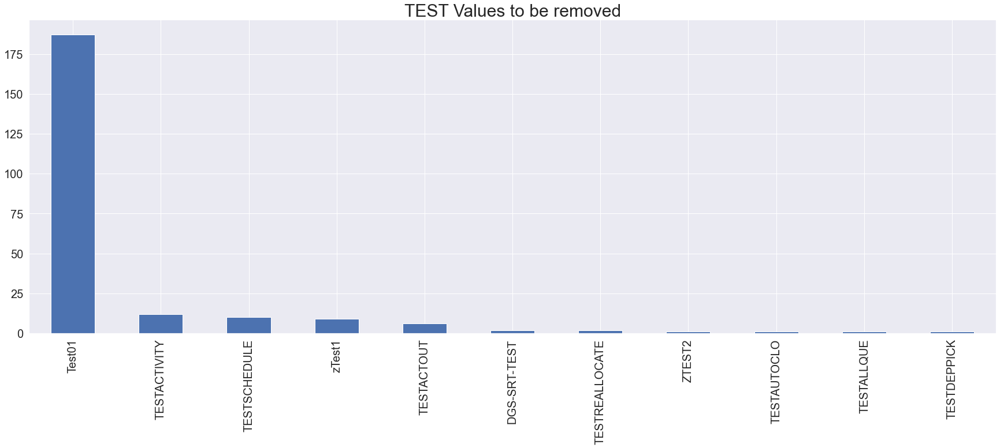

before drop:  (1003829, 30)
after drop:  (1003597, 30)


,X,Y,OBJECTID,SERVICECODE,SERVICECODEDESCRIPTION,SERVICETYPECODEDESCRIPTION,ORGANIZATIONACRONYM,SERVICECALLCOUNT,ADDDATE,RESOLUTIONDATE,SERVICEDUEDATE,SERVICEORDERDATE,INSPECTIONFLAG,INSPECTIONDATE,INSPECTORNAME,SERVICEORDERSTATUS,STATUS_CODE,SERVICEREQUESTID,PRIORITY,STREETADDRESS,XCOORD,YCOORD,LATITUDE,LONGITUDE,CITY,STATE,ZIPCODE,MARADDRESSREPOSITORYID,WARD,DETAILS


In [458]:
#Remove TEST Service codes

print('remove the following test records: ',data_311.loc[(data_311.SERVICECODE.str.contains('TEST', regex=True, case=False, na=False))].shape)
print('do not remove these as they include Test Animal - Vaccination Investigation - DAS: ',data_311.loc[(data_311.SERVICECODEDESCRIPTION.str.contains('TEST', regex=True, case=False, na=False))].shape)

data_311.loc[data_311.SERVICECODE.str.contains('TEST', regex=True, case=False, na=False)]['SERVICECODE'].value_counts().plot.bar()
plt.title('TEST Values to be removed', fontsize=30)

plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.show()


# print('-----'*20)
drop_mask=data_311.loc[data_311.SERVICECODE.str.contains('TEST', regex=True, case=False, na=False)]
drop_mask
print('before drop: ', data_311.shape)
data_311.drop(drop_mask.index, inplace=True)
data_311=data_311.reset_index(drop=True)
print('after drop: ', data_311.shape)
data_311.loc[data_311.SERVICECODE.str.contains('TEST', regex=True, case=False, na=False)]

In [459]:
#convert Ward Number into a string
data_311['WARD']=data_311['WARD'].astype('Int64').astype('str')
# #convert zipcode to string object
data_311['ZIPCODE']=data_311['ZIPCODE'].astype('Int64').astype('str')

#select the columns I want
data_311=data_311[[ 'OBJECTID', 'SERVICECODE', 'SERVICECODEDESCRIPTION',
       'SERVICETYPECODEDESCRIPTION', 'ORGANIZATIONACRONYM', 'SERVICECALLCOUNT',
       'ADDDATE', 'RESOLUTIONDATE', 'SERVICEDUEDATE', 'SERVICEORDERDATE',
       'INSPECTIONFLAG', 'INSPECTIONDATE', 
       'SERVICEORDERSTATUS', 'STATUS_CODE', 'SERVICEREQUESTID', 'PRIORITY',
       'STREETADDRESS', 'LATITUDE', 'LONGITUDE', 'CITY',
       'STATE', 'ZIPCODE', 'WARD', 'DETAILS']]

print('--'*10,'Review of the firt row of data','--'*10)
print(data_311.tail(1).T, '\n'*3)
# print('-----'*20)
print('--'*10,'Review of data shape (rows,columns) and data types ','--'*10,'\n'*2)
data_311.info()

-------------------- Review of the firt row of data --------------------
                                                              1003596
OBJECTID                                                       660505
SERVICECODE                                                     S0423
SERVICECODEDESCRIPTION                              Supercan - Repair
SERVICETYPECODEDESCRIPTION  SWMA- Solid Waste Management Admistration
ORGANIZATIONACRONYM                                               DPW
SERVICECALLCOUNT                                                    1
ADDDATE                                     2020-12-29 14:53:41+00:00
RESOLUTIONDATE                                                    NaT
SERVICEDUEDATE                              2021-01-28 14:53:41+00:00
SERVICEORDERDATE                            2020-12-29 14:53:41+00:00
INSPECTIONFLAG                                                      0
INSPECTIONDATE                              2020-12-29 14:54:04+00:00
SERVICEORDERSTATU

## STEP 2 --A: NULL/ NaN Values Imputation STATUS_CODE
----------------------------------------------------------------------------------------------------
The missing data percentage tells us the percentage of null values for each row. The presence of null values and how they are imputed has an effect on the analysis.

The STATUS_CODE is our target feature of analyis, so we will need to address these cases

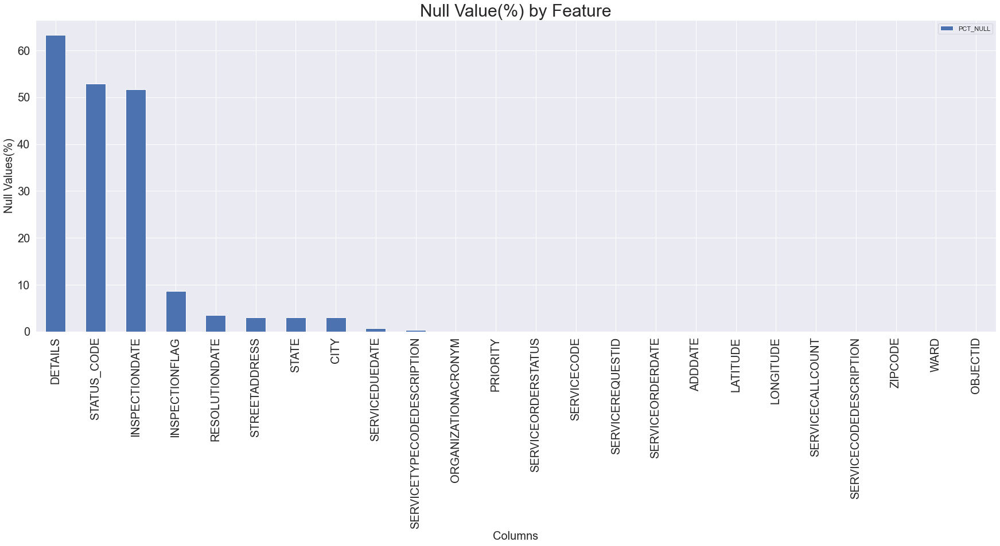

In [460]:
data_311_null={}
for i in data_311.columns:
    data_311_null[i]=(data_311[i].isna().sum() / len(data_311) * 100)
pd.DataFrame(list(data_311_null.items()), columns = ['COL', 'PCT_NULL']).sort_values(by=['PCT_NULL'], ascending=False).set_index(['COL']).plot.bar()


plt.title('Null Value(%) by Feature', fontsize=30)
plt.ylabel('Null Values(%)', fontsize=20)
plt.xlabel('Columns', fontsize=20)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.show()



##  MANAGING NAN and Duplicated Values 

-Investigate and address NAN values of the STATUS_CODE

-Recreate SERVICEORDERSTATUS



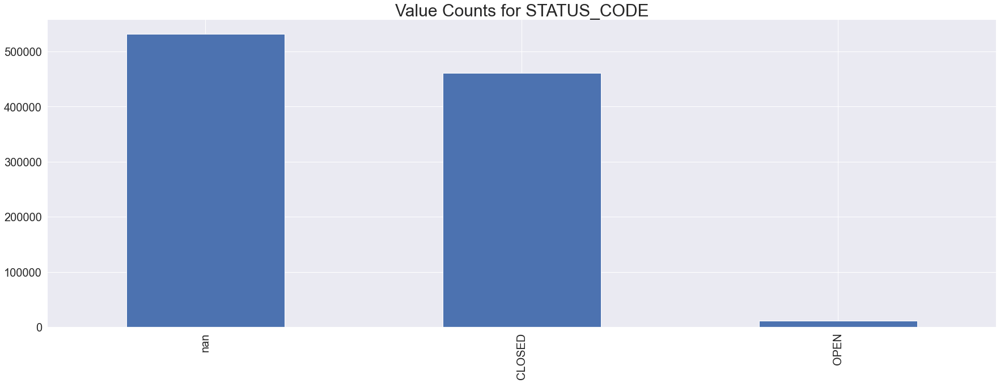

NaN       531474
CLOSED    460635
OPEN       11488
Name: STATUS_CODE, dtype: int64

In [461]:
data_311.STATUS_CODE.value_counts(dropna=False).plot.bar()


#remove voided, duplicated, dupopen
#change closedii to closed
plt.title('Value Counts for STATUS_CODE', fontsize=30)


plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.show()
data_311.STATUS_CODE.value_counts(dropna=False)

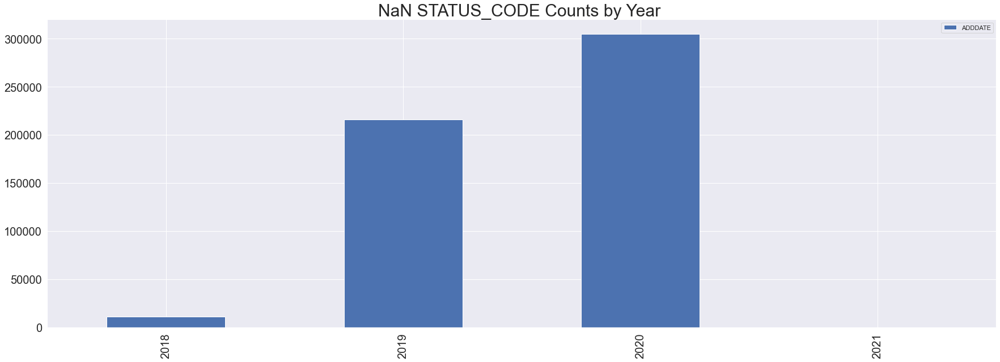

ADDDATE  STATUS_CODE
2018     CLOSED         316249
         NaN             11010
         OPEN             6732
2019     NaN            215716
         CLOSED         144386
         OPEN             4756
2020     NaN            304716
2021     NaN                32
Name: STATUS_CODE, dtype: int64

In [462]:
#It appears that something changed after 2017 and the status code was not used to report the status of service requests. 
#In 2018 there is a decrease in open status. In 2019 NaN is the top status and in 2020 there is only NaN status
#This tells me that there was a decision to stop using STATUS_CODE 

pd.DataFrame(data_311[data_311.STATUS_CODE.isna()].ADDDATE.dt.year.value_counts()).sort_index(ascending=True).plot.bar()
plt.title('NaN STATUS_CODE Counts by Year ', fontsize=30)


plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.show()

data_311.groupby(data_311.ADDDATE.dt.year)['STATUS_CODE'].value_counts(dropna=False)

In [463]:
#The SERVICEORDERSTATUS looks promising as a proxy byitself or in combination with other features to get the current status of a service requests
#BEFORE SERIVCE ORDER STATUS DATA CLEANING 
data_311['SERVICEORDERSTATUS'].value_counts(dropna=False)

Closed                                      497535
CLOSED                                      457436
In-Progress                                  18234
Closed (Duplicate)                            9309
IN-PROGRESS                                   8315
Open                                          4913
DUPLICATE (OPENED)                            2398
DUPLICATE (CLOSED)                            2381
OPEN                                           771
Voided                                         499
Closed (Transferred)                           419
CLOSED - INCOMPLETE INFORMATION                397
VOIDED                                         383
Duplicate (Closed)                             252
Open (Duplicate)                               138
Closed - Incomplete Information                 82
NaN                                             34
Voided (Duplicate)                              28
In Progress                                     27
New                            

In [464]:
#Recreate a "cleaned" version of the SERVICEORDERSTATUS with the values recategorized
data_311['SERVICEORDERSTATUS_UPDATED']=data_311['SERVICEORDERSTATUS'].str.upper()

data_311.loc[data_311.SERVICEORDERSTATUS_UPDATED.str.contains('DUPLICATE', regex=True, case=False, na=False),'SERVICEORDERSTATUS_UPDATED']='DUPLICATE'
data_311.loc[data_311.SERVICEORDERSTATUS_UPDATED.str.contains('CLOSE', regex=True, case=False, na=False),'SERVICEORDERSTATUS_UPDATED']='CLOSED'

data_311.loc[data_311.SERVICEORDERSTATUS_UPDATED.str.contains('PROGRESS', regex=True, case=False,na=False),'SERVICEORDERSTATUS_UPDATED']='OPEN'
data_311.loc[data_311.SERVICEORDERSTATUS_UPDATED.str.contains('NEW', regex=True, case=False,na=False),'SERVICEORDERSTATUS_UPDATED']='OPEN'
data_311.loc[data_311.SERVICEORDERSTATUS_UPDATED.str.contains('OPEN', regex=True, case=False, na=False),'SERVICEORDERSTATUS_UPDATED']='OPEN'




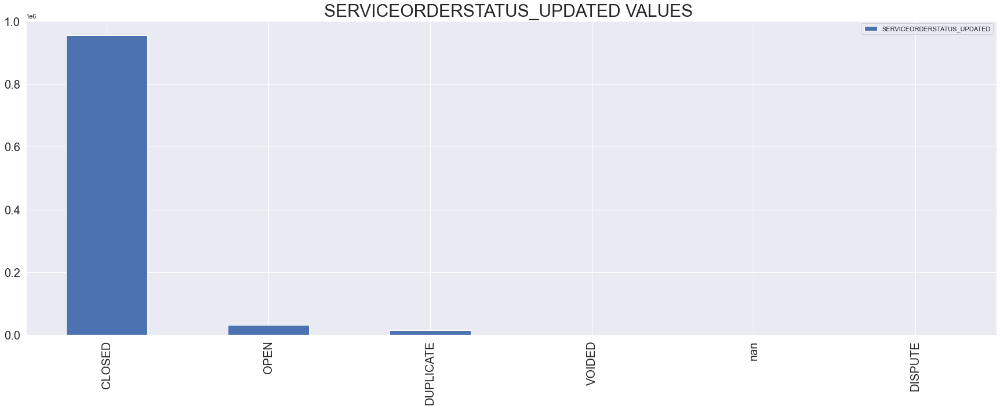

In [465]:
#SERVICE ORDER STATUS after cleanin
pd.DataFrame(data_311['SERVICEORDERSTATUS_UPDATED'].value_counts(dropna=False)).plot.bar()

plt.title('SERVICEORDERSTATUS_UPDATED VALUES ', fontsize=30)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.show()



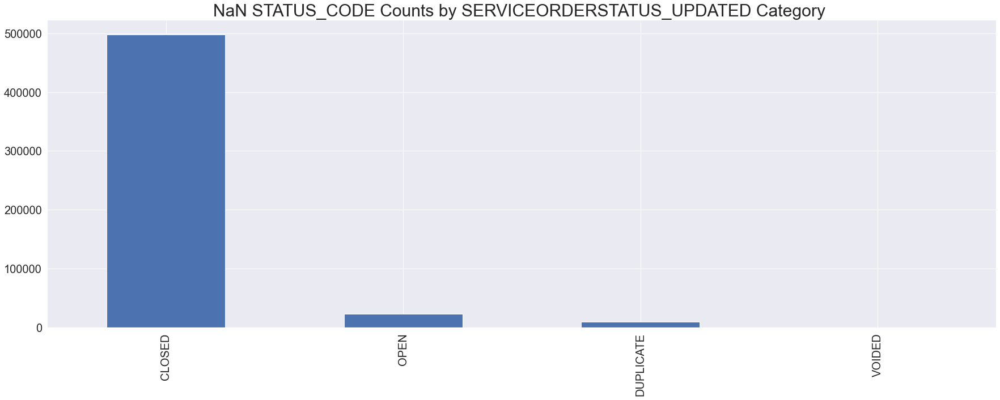

,SERVICEORDERSTATUS_UPDATED
CLOSED,498044
OPEN,23187
DUPLICATE,9744
VOIDED,499


In [466]:
#THE NAN STATUS_CODE are predominantly CLOSED but there other categories --> open, duplicate and voided
data_311[data_311['STATUS_CODE'].isna()]['SERVICEORDERSTATUS_UPDATED'].value_counts(dropna=False).plot.bar()



plt.title('NaN STATUS_CODE Counts by SERVICEORDERSTATUS_UPDATED Category ', fontsize=30)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.show()

pd.DataFrame(data_311[data_311['STATUS_CODE'].isna()]['SERVICEORDERSTATUS_UPDATED'].value_counts(dropna=False))

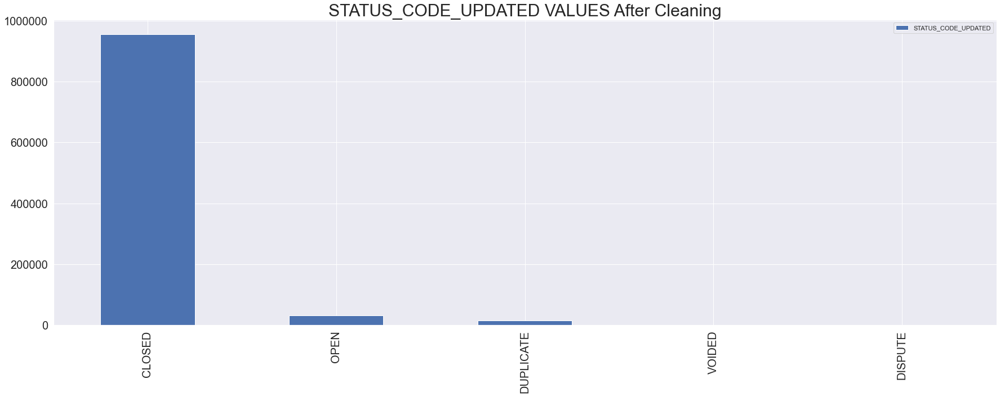

,STATUS_CODE_UPDATED
CLOSED,955915
OPEN,32276
DUPLICATE,14523
VOIDED,882
DISPUTE,1


In [467]:
#UPDATED STATUS CODE 
#CLEAN VERSION OF STATUS_CODE BASED ON ANALYSIS ABOVE
#IF STATUS_CODE IS NAN , THEN get status from SERVICEORDERSTATUS_UPDATED
#VALUES FROM SERVICEORDERSTATUS_UPDATED that are in DUPLICATE, VOIDED or DISPUTE will be excluded from the analysis
# pd.set_option('display.float_format', lambda x: '%.6f' % x)

data_311['STATUS_CODE_UPDATED']=data_311['STATUS_CODE'].str.upper()
data_311.loc[data_311.STATUS_CODE.isna(),'STATUS_CODE_UPDATED']=data_311['SERVICEORDERSTATUS_UPDATED']
data_311.loc[data_311.SERVICEORDERSTATUS_UPDATED.isin(['DUPLICATE','VOIDED','DISPUTE']),'STATUS_CODE_UPDATED']=data_311['SERVICEORDERSTATUS_UPDATED']



#ORDER STATUS after cleanin
ax=pd.DataFrame(data_311['STATUS_CODE_UPDATED'].value_counts(dropna=False)).plot.bar()
plt.ticklabel_format(axis="y", style="plain")
plt.title('STATUS_CODE_UPDATED VALUES After Cleaning', fontsize=30)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.show()

pd.DataFrame(data_311['STATUS_CODE_UPDATED'].value_counts(dropna=False))

## STEP 2 --B:  DATA CLEANING: ERRONEOUS DATE -- DATE FEATURES

--the realistic ranges of dates for each date related feature provides a quick assurance of data quality 

--the table below provides the range for all the date features. Based on the min(first) and max(last) range, there are some data quality concerns with RESOLUTIONDATE(first), SERVICEDUEDATE (first and last), INSPECTIONDATE (first and last)

--ADDDATE and SERVICEORDERDATE date features for pass the range expectation test

--ID FEATURES WITH NULL OR ERRONEOUS Date and which status_code_update is CLOSED


In [468]:
#Here we can see that there are some erroneous dates (anything with date under 2016 and date greater than 2021)
data_311[['ADDDATE','RESOLUTIONDATE', 'SERVICEDUEDATE', 'SERVICEORDERDATE','INSPECTIONDATE']].describe(include='all')


,ADDDATE,RESOLUTIONDATE,SERVICEDUEDATE,SERVICEORDERDATE,INSPECTIONDATE
count,1003597,968723,997175,1003597,484502
unique,993228,946769,557223,993228,368215
top,2019-06-17 18:20:13+00:00,2020-12-23 04:47:06+00:00,2018-07-13 21:00:00+00:00,2019-06-17 18:20:13+00:00,2020-09-23 15:19:00+00:00
freq,6,200,862,6,17
first,2018-01-01 05:05:35+00:00,2018-01-01 05:19:26+00:00,2018-01-02 06:00:08+00:00,2018-01-01 05:05:35+00:00,2018-01-02 19:50:00+00:00
last,2021-01-01 04:57:36+00:00,2021-04-02 20:19:11+00:00,2022-12-16 22:45:30+00:00,2021-01-01 04:57:36+00:00,2025-05-11 12:56:00+00:00


---------------------------------------------------------------------------------------------------- 

Add date appears to have no date errors


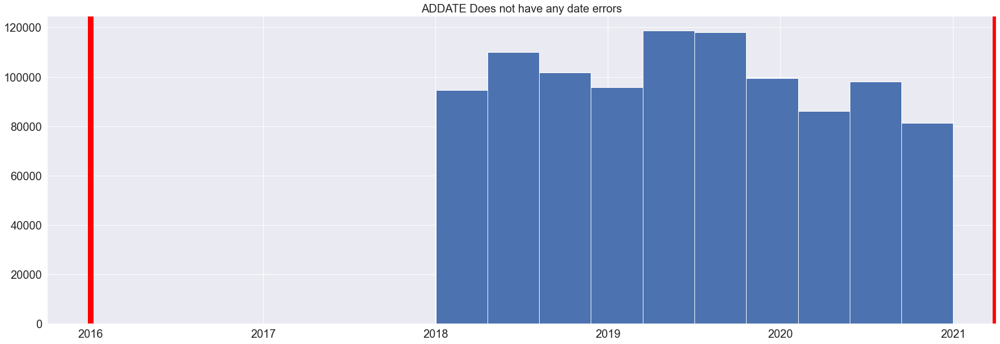

---------------------------------------------------------------------------------------------------- 

ISSUE 1 - Resolution date older than 2016 and past 4/2021 is erroneous 


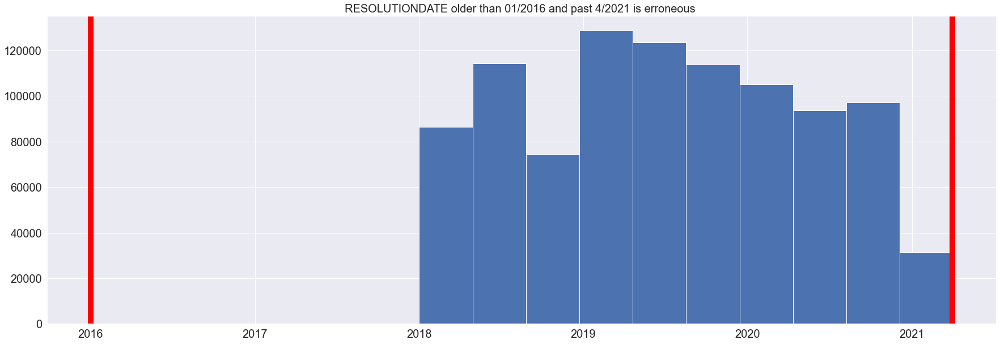

---------------------------------------------------------------------------------------------------- 

ISSUE 2 - Service due date older than 1/2016 is erroneous. Anything past 4/2021 is possible but need to check on status and other date features


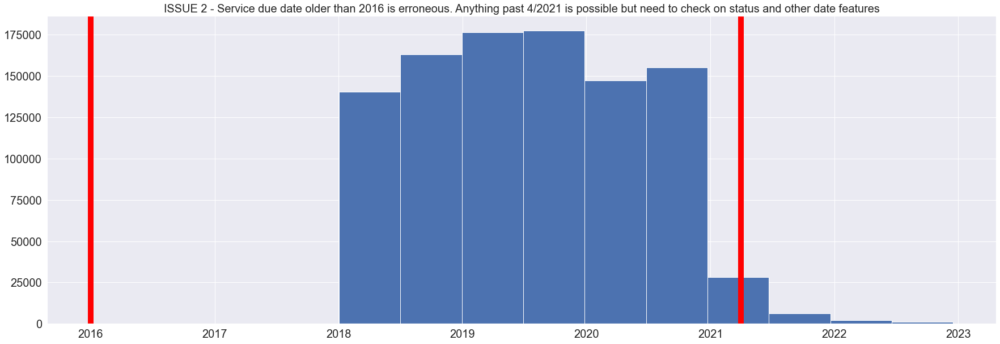

---------------------------------------------------------------------------------------------------- 

Service order date appeares fine for now


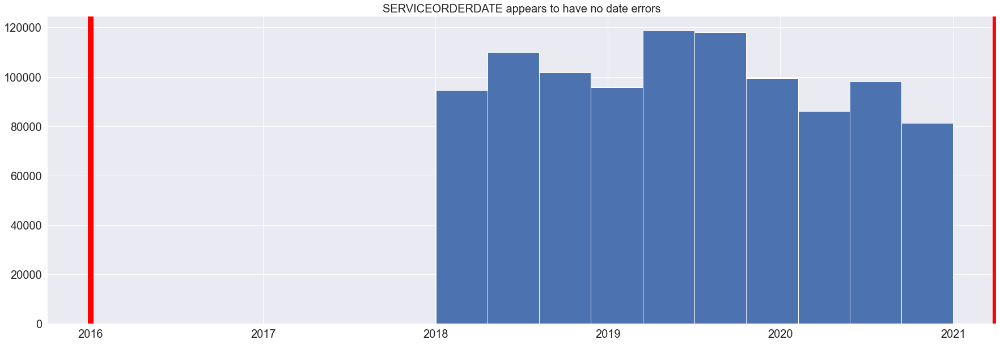

---------------------------------------------------------------------------------------------------- 

ISSUE 3 - Inspection date date older than 1/2016 is erroneous-- Anything past 4/2021 is possible but need to check on status and other date features


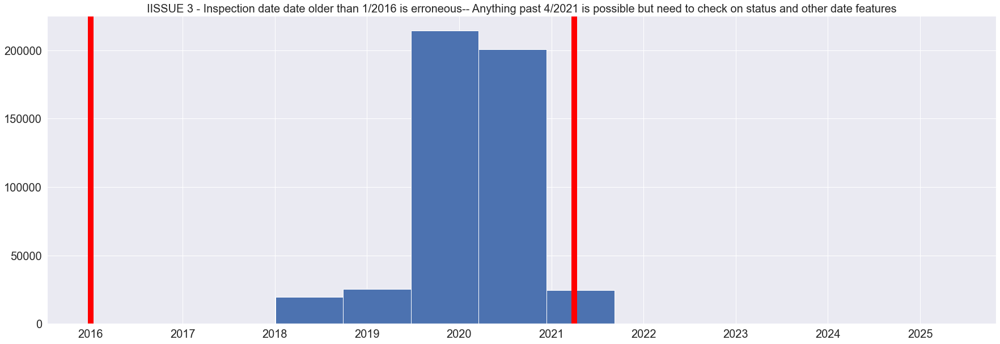

In [469]:
#Visualize the distribution of dates and highlight anything beyond v line as erronous 
print('-----'*20,'\n')
print('Add date appears to have no date errors')
ax=data_311['ADDDATE'].hist()
plt.title('ADDATE Does not have any date errors', fontsize=20)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
ax.axvline(pd.to_datetime('2016-01-01', utc=True), color='red', linewidth=10)
ax.axvline(pd.to_datetime('2021-04-01', utc=True), color='red', linewidth=10)
plt.show()


print('-----'*20,'\n')
print('ISSUE 1 - Resolution date older than 2016 and past 4/2021 is erroneous ')
ax=data_311['RESOLUTIONDATE'].hist()
plt.title('RESOLUTIONDATE older than 01/2016 and past 4/2021 is erroneous ', fontsize=20)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
ax.axvline(pd.to_datetime('2016-01-01', utc=True), color='red', linewidth=10)
ax.axvline(pd.to_datetime('2021-04-01', utc=True), color='red', linewidth=10)
plt.show()

print('-----'*20,'\n')
print('ISSUE 2 - Service due date older than 1/2016 is erroneous. Anything past 4/2021 is possible but need to check on status and other date features' )
ax=data_311['SERVICEDUEDATE'].hist()
plt.title('ISSUE 2 - Service due date older than 2016 is erroneous. Anything past 4/2021 is possible but need to check on status and other date features', fontsize=20)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
ax.axvline(pd.to_datetime('2016-01-01', utc=True), color='red', linewidth=10)
ax.axvline(pd.to_datetime('2021-04-01', utc=True), color='red', linewidth=10)
plt.show()

print('-----'*20,'\n')
print('Service order date appeares fine for now' )
ax=data_311['SERVICEORDERDATE'].hist()
plt.title('SERVICEORDERDATE appears to have no date errors', fontsize=20)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
ax.axvline(pd.to_datetime('2016-01-01', utc=True), color='red', linewidth=10)
ax.axvline(pd.to_datetime('2021-04-01', utc=True), color='red', linewidth=10)
plt.show()
print('-----'*20,'\n')
print('ISSUE 3 - Inspection date date older than 1/2016 is erroneous-- Anything past 4/2021 is possible but need to check on status and other date features' )
ax=data_311['INSPECTIONDATE'].hist()
plt.title('IISSUE 3 - Inspection date date older than 1/2016 is erroneous-- Anything past 4/2021 is possible but need to check on status and other date features', fontsize=20)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
ax.axvline(pd.to_datetime('2016-01-01', utc=True), color='red', linewidth=10)
ax.axvline(pd.to_datetime('2021-04-01', utc=True), color='red', linewidth=10)
plt.show()



In [470]:
# data_311[(data_311['RESOLUTIONDATE']<'01-01-2016') | (data_311['RESOLUTIONDATE']>'04-01-2021')]

---------------------------------------------------------------------------------------------------- 

ISSUE 1 -- The STATUS_CODE_UPDATED by RESOLUTIONDATE for erroneous dates data tells me that these dates should be set to null
---------------------------------------------------------------------------------------------------- 

ISSUE 2 -- The STATUS_CODE_UPDATED by SERVICEDUEDATE for erroneous dates will need to be reviewed further
---------------------------------------------------------------------------------------------------- 

ISSUE 3 -- The STATUS_CODE_UPDATED by INSPECTIONDATE for erroneous dates will need to be reviewed further


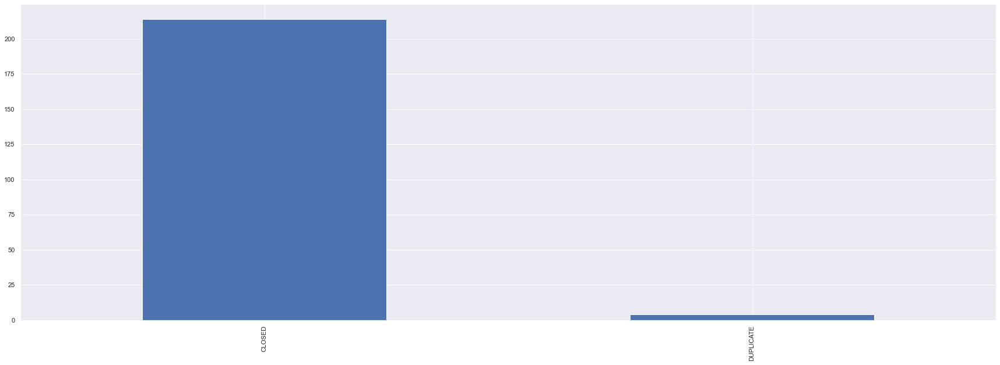

In [471]:
#the epoch date tells me that the status of the request may give infomation about the quality of the RESOLUTIONDATE
print('-----'*20,'\n')
print('ISSUE 1 -- The STATUS_CODE_UPDATED by RESOLUTIONDATE for erroneous dates data tells me that these dates should be set to null')

data_311[(data_311['RESOLUTIONDATE']<'01-01-2016') | (data_311['RESOLUTIONDATE']>'04-01-2021')]['STATUS_CODE_UPDATED'].value_counts(dropna=False).plot.bar()
# plt.title('STATUS_CODE BY ERRONEOUS RESOLUTION DATE', fontsize=20)
# plt.yticks(fontsize=20)
# plt.xticks(fontsize=20)
# plt.show()


print('-----'*20,'\n')
print('ISSUE 2 -- The STATUS_CODE_UPDATED by SERVICEDUEDATE for erroneous dates will need to be reviewed further')


# data_311[(data_311['SERVICEDUEDATE']<'01-01-2016') | (data_311['SERVICEDUEDATE']>'04-01-2021')]['STATUS_CODE_UPDATED'].value_counts(dropna=False).plot.bar()
# plt.title('STATUS_CODE BY ERRONEOUS SERVICE DUE DATE', fontsize=20)
# plt.yticks(fontsize=20)
# plt.xticks(fontsize=20)
# plt.show()

         
#NO RECO
# data_311[(data_311['SERVICEORDERDATE'].dt.year<2010)]['STATUS_CODE'].value_counts().plot.bar()
# plt.title('STATUS_CODE BY ERRONEOUS SERVICE ORDER DATE', fontsize=20)
# plt.yticks(fontsize=20)
# plt.xticks(fontsize=20)
# plt.show()
          

print('-----'*20,'\n')
print('ISSUE 3 -- The STATUS_CODE_UPDATED by INSPECTIONDATE for erroneous dates will need to be reviewed further')
      
# data_311[(data_311['INSPECTIONDATE']<'01-01-2016') | (data_311['INSPECTIONDATE']>'04-01-2021')]['STATUS_CODE_UPDATED'].value_counts(dropna=False).plot.bar()
# plt.title('STATUS_CODE BY ERRONEOUS INSPECTION DATE', fontsize=20)
# plt.yticks(fontsize=20)
# plt.xticks(fontsize=20)
# plt.show()


         
          
 


ISSUE 1 - RESOLUTION DATE 
---------------------------------------------------------------------------------------------------- 

---------------------------------------------------------------------------------------------------- 

ISSUE 1 - Before Data Cleaning - Resolution date older than 1/2016 and past 4/2021 is erroneous 


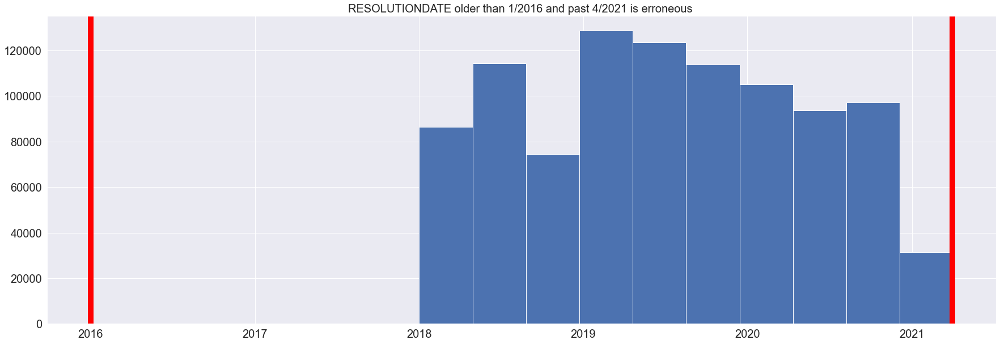

---------------------------------------------------------------------------------------------------- 

ISSUE 1 - After Data Cleaning - Resolution date older than 1/2016 and past 4/2021 is erroneous 


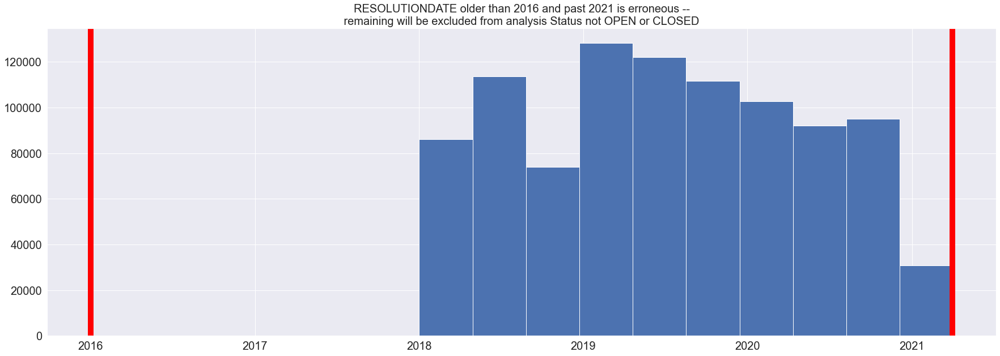

In [472]:
#CORRECT ISSUE 1 - RESOLUTION DATE

print('ISSUE 1 - RESOLUTION DATE ')
print('-----'*20,'\n')

print('-----'*20,'\n')
print('ISSUE 1 - Before Data Cleaning - Resolution date older than 1/2016 and past 4/2021 is erroneous ')
ax=data_311['RESOLUTIONDATE'].hist()
plt.title('RESOLUTIONDATE older than 1/2016 and past 4/2021 is erroneous ', fontsize=20)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
ax.axvline(pd.to_datetime('2016-01-01', utc=True), color='red', linewidth=10)
ax.axvline(pd.to_datetime('2021-04-01', utc=True), color='red', linewidth=10)
plt.show()


data_311['RESOLUTIONDATE_UPDATED']=data_311['RESOLUTIONDATE']

# data_311[((data_311['RESOLUTIONDATE']<'01-01-2016') | (data_311['RESOLUTIONDATE']>'04-01-2021'))&(data_311['STATUS_CODE_UPDATED']=='OPEN') ]

data_311.loc[(((data_311['RESOLUTIONDATE']<'01-01-2016') | (data_311['RESOLUTIONDATE']>'04-01-2021'))&(data_311['STATUS_CODE_UPDATED']=='OPEN')) ,'RESOLUTIONDATE_UPDATED']=np.datetime64('nat')

# data_311[(data_311['RESOLUTIONDATE_UPDATED']<'01-01-2016') | (data_311['RESOLUTIONDATE_UPDATED']>'04-01-2021')]['STATUS_CODE_UPDATED'].value_counts(dropna=False).plot.bar()
# plt.title('STATUS_CODE BY ERRONEOUS RESOLUTION DATE', fontsize=20)
# plt.yticks(fontsize=20)
# plt.xticks(fontsize=20)
# plt.show()


print('-----'*20,'\n')
print('ISSUE 1 - After Data Cleaning - Resolution date older than 1/2016 and past 4/2021 is erroneous ')
ax=data_311[~data_311['STATUS_CODE_UPDATED'].isin(['DUPLICATE','DISPUTE'])]['RESOLUTIONDATE_UPDATED'].hist()
plt.title('RESOLUTIONDATE older than 2016 and past 2021 is erroneous --\n remaining will be excluded from analysis Status not OPEN or CLOSED ', fontsize=20)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
ax.axvline(pd.to_datetime('2016-01-01', utc=True), color='red', linewidth=10)
ax.axvline(pd.to_datetime('2021-04-01', utc=True), color='red', linewidth=10)
plt.show()



ISSUE 2 - SERVICE DUE DATE 
---------------------------------------------------------------------------------------------------- 

---------------------------------------------------------------------------------------------------- 

ISSUE 2 - Before Data Cleaning - 
 Service due date older than 2016 is s erroneous. Anything past 2021 is possible but need to check on status and other date features


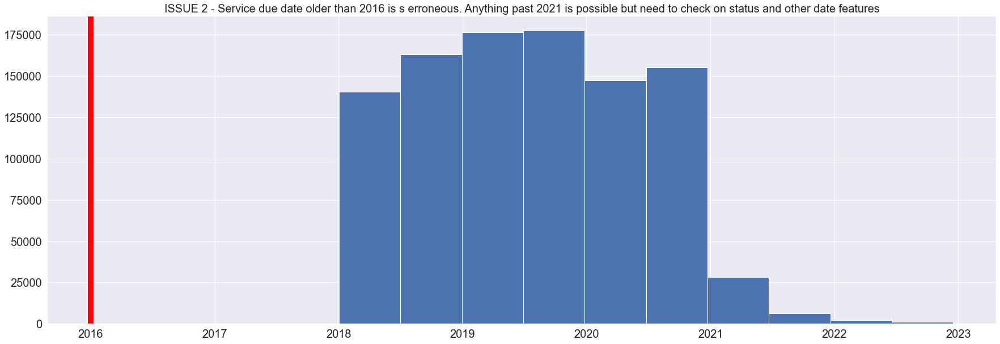

---------------------------------------------------------------------------------------------------- 

ISSUE 2 - 
 After Data Cleaning - Service due date older than 2016 is s erroneous. Anything past 2021 is possible but need to check on status and other date features


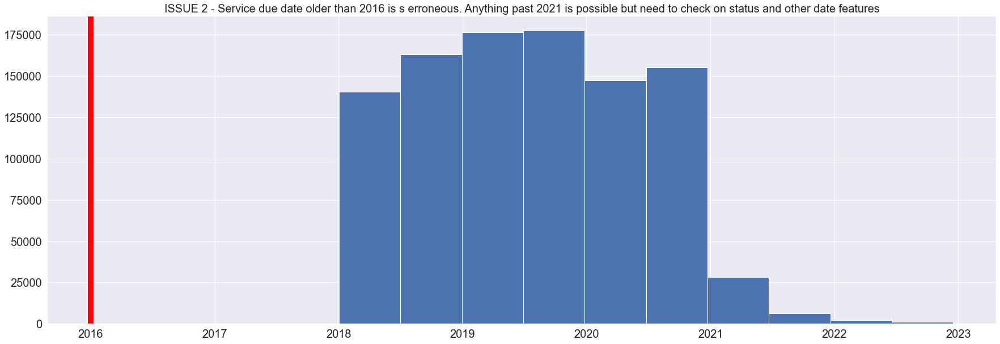

In [473]:
#CORRECT ISSUE 2 - SERVICE DUE DATE

print('ISSUE 2 - SERVICE DUE DATE ')
print('-----'*20,'\n')

print('-----'*20,'\n')
print('ISSUE 2 - Before Data Cleaning - \n Service due date older than 2016 is s erroneous. Anything past 2021 is possible but need to check on status and other date features' )
ax=data_311['SERVICEDUEDATE'].hist()
plt.title('ISSUE 2 - Service due date older than 2016 is s erroneous. Anything past 2021 is possible but need to check on status and other date features', fontsize=20)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
ax.axvline(pd.to_datetime('2016-01-01', utc=True), color='red', linewidth=10)
# ax.axvline(pd.to_datetime('2021-04-01', utc=True), color='red', linewidth=10)
plt.show()

data_311['SERVICEDUEDATE_UPDATED']=data_311['SERVICEDUEDATE']

#fix epoch date
data_311.loc[(data_311['SERVICEDUEDATE_UPDATED']=='01-01-1970') ,'SERVICEDUEDATE_UPDATED']=np.datetime64('nat')


data_311[((data_311['SERVICEDUEDATE_UPDATED']<'01-01-2016') | (data_311['SERVICEDUEDATE_UPDATED']>'04-01-2021'))]['STATUS_CODE_UPDATED'].value_counts()

#service due date not greater than add date
data_311[((data_311['SERVICEDUEDATE_UPDATED']<data_311['ADDDATE'])) ]#| (data_311['SERVICEDUEDATE']>'04-01-2021'))]

#service due date not less than resolution date ---THIS IS FINE
data_311[((data_311['SERVICEDUEDATE_UPDATED']>data_311['RESOLUTIONDATE_UPDATED'])) ]#| (data_311['SERVICEDUEDATE']>'04-01-2021'))]


#Service due date not under 01/01/2016
data_311[((data_311['SERVICEDUEDATE_UPDATED']<'01-01-2016')) ]#['STATUS_CODE_UPDATED'].value_counts()

print('-----'*20,'\n')
print('ISSUE 2 - \n After Data Cleaning - Service due date older than 2016 is s erroneous. Anything past 2021 is possible but need to check on status and other date features' )
ax=data_311['SERVICEDUEDATE_UPDATED'].hist()
plt.title('ISSUE 2 - Service due date older than 2016 is s erroneous. Anything past 2021 is possible but need to check on status and other date features', fontsize=20)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
ax.axvline(pd.to_datetime('2016-01-01', utc=True), color='red', linewidth=10)
# ax.axvline(pd.to_datetime('2021-04-01', utc=True), color='red', linewidth=10)
plt.show()


# data_311.loc[(((data_311['RESOLUTIONDATE']<'01-01-2016') | (data_311['RESOLUTIONDATE']>'04-01-2021'))&(data_311['STATUS_CODE_UPDATED']=='OPEN')) ,'RESOLUTIONDATE_UPDATED']=np.datetime64('nat')

# data_311[(data_311['RESOLUTIONDATE_UPDATED']<'01-01-2016') | (data_311['RESOLUTIONDATE_UPDATED']>'04-01-2021')]['STATUS_CODE_UPDATED'].value_counts(dropna=False).plot.bar()
# plt.title('STATUS_CODE BY ERRONEOUS RESOLUTION DATE', fontsize=20)
# plt.yticks(fontsize=20)
# plt.xticks(fontsize=20)
# plt.show()

---------------------------------------------------------------------------------------------------- 

ISSUE 3 - Before Date Cleaning - 
 Inspection date date older than 1/2016 is erroneous-- Anything past 4/2021 is possible but need to check on status and other date features


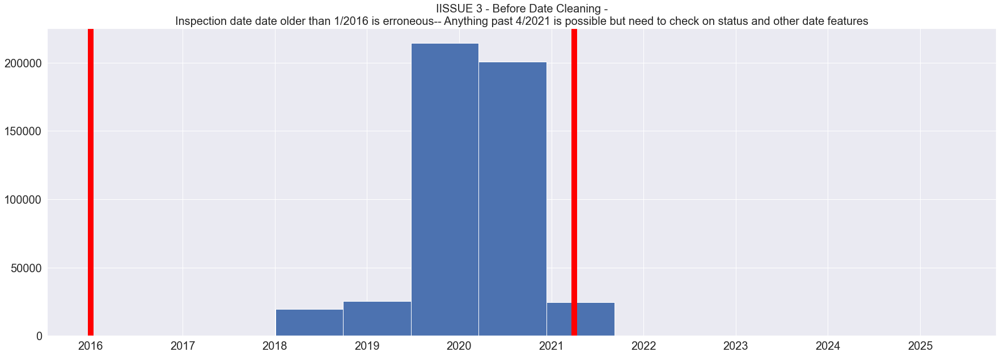

---------------------------------------------------------------------------------------------------- 

ISSUE 3 - After Date Cleaning -
 Inspection date date older than 1/2016 is erroneous-- Anything past 4/2021 is possible but need to check on status and other date features


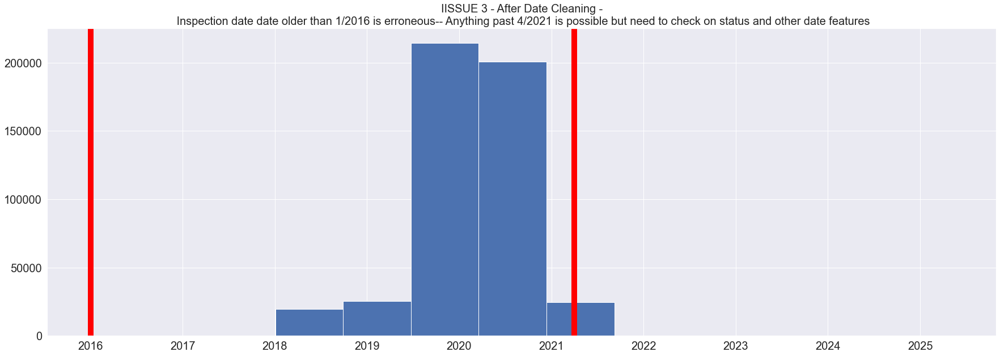

In [474]:
print('-----'*20,'\n')
print('ISSUE 3 - Before Date Cleaning - \n Inspection date date older than 1/2016 is erroneous-- Anything past 4/2021 is possible but need to check on status and other date features' )
ax=data_311['INSPECTIONDATE'].hist()
plt.title('IISSUE 3 - Before Date Cleaning -\nInspection date date older than 1/2016 is erroneous-- Anything past 4/2021 is possible but need to check on status and other date features', fontsize=20)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
ax.axvline(pd.to_datetime('2016-01-01', utc=True), color='red', linewidth=10)
ax.axvline(pd.to_datetime('2021-04-01', utc=True), color='red', linewidth=10)
plt.show()

data_311['INSPECTIONDATE_UPDATED']=data_311['INSPECTIONDATE']

data_311.loc[(data_311['INSPECTIONDATE']=='01-01-1970') ,'INSPECTIONDATE_UPDATED']=np.datetime64('nat')


print('-----'*20,'\n')

print('ISSUE 3 - After Date Cleaning -\n Inspection date date older than 1/2016 is erroneous-- Anything past 4/2021 is possible but need to check on status and other date features' )
ax=data_311['INSPECTIONDATE_UPDATED'].hist()
plt.title('IISSUE 3 - After Date Cleaning -\n Inspection date date older than 1/2016 is erroneous-- Anything past 4/2021 is possible but need to check on status and other date features', fontsize=20)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
ax.axvline(pd.to_datetime('2016-01-01', utc=True), color='red', linewidth=10)
ax.axvline(pd.to_datetime('2021-04-01', utc=True), color='red', linewidth=10)
plt.show()


## STEP 2 --C: DATA CLEANING: STANDARDIZE CATEGORICAL FEATURES

--SERVICETYPECODEDESCRIPTION to UPPER

--PRIORITY to UPPER

--GET DC GOVT. OFFICE NAME FROM ACCRONYM

--INSPECTION FLAG change YES to 1 NO to 0

--DC ward resolve missing ward info

In [475]:
data_311['SERVICECODEDESCRIPTION_UPDATED']=data_311['SERVICECODEDESCRIPTION'].str.upper()

data_311['SERVICETYPECODEDESCRIPTION_UPDATED']=data_311.SERVICETYPECODEDESCRIPTION.str.upper()#.value_counts()
data_311['PRIORITY_UPDATED']=data_311.PRIORITY.str.upper()#.value_counts()

dc_gov_dept={'DPW':'PUBLIC WORKS', 'DDOT': 'TRANSPORTATION','DMV':'MOTOR VEHICLES', 'OUC':'UNIFIED COMM', 
  'DOH':'HEALTH','DCRA':'CONSUMER REG. AFFAIRS', 'FEMS':'FIRE EMERGENCY MED. SERVICES', 'SERVE DC':'VOLUNTEERISM PARTNERSHIPS',
   'DOEE': 'ENERGY ENV', 'ORM':'RISK MGT', 'DGS': 'GEN SERV', 'DC-ICH': 'COUNCIL HOMELESSNESS', 'OUC - SNOW':'UNIFIED COMM. - SNOW',
   'DFHV':'FOR HIRE VEHICLES', 'DDS':'DISABILITY SERV'   
  }

data_311['AGENCY']=data_311.ORGANIZATIONACRONYM.str.upper().apply(lambda x: dc_gov_dept.get(x))  # Im seeing errors here 

data_311['INSPECTIONFLAG_UPDATED']=data_311.INSPECTIONFLAG
data_311.loc[data_311.INSPECTIONFLAG_UPDATED.isin(['N','0']),'INSPECTIONFLAG_UPDATED']=0
data_311.loc[data_311.INSPECTIONFLAG_UPDATED.isin(['1','Y','1.0']),'INSPECTIONFLAG_UPDATED']=1

data_311.loc[99].T


OBJECTID                                                                 734472
SERVICECODE                                                               S0441
SERVICECODEDESCRIPTION                                Trash Collection - Missed
SERVICETYPECODEDESCRIPTION            SWMA- Solid Waste Management Admistration
ORGANIZATIONACRONYM                                                         DPW
SERVICECALLCOUNT                                                              1
ADDDATE                                               2018-01-06 21:47:40+00:00
RESOLUTIONDATE                                        2018-01-08 10:03:48+00:00
SERVICEDUEDATE                                        2018-01-09 22:00:00+00:00
SERVICEORDERDATE                                      2018-01-06 21:47:40+00:00
INSPECTIONFLAG                                                                N
INSPECTIONDATE                                                              NaT
SERVICEORDERSTATUS                      

## STEP 2 - Get DC WARD for every SERVICE CALL 
--Get ACS Economic and Demographic Characteristics for each DC Ward

--replace missing WARD information using coordinate information to extract WARD

In [476]:

# https://geopandas.org/gallery/create_geopandas_from_pandas.html
#resources:
# https://geopandas.org/gallery/create_geopandas_from_pandas.html
#census data  - https://github.com/jtleider/censusdata
#https://jtleider.github.io/censusdata/api.html#module-censusdata.variable_info

acs_econ ='https://maps2.dcgis.dc.gov/dcgis/rest/services/DCGIS_DATA/Demographic_WebMercator/MapServer/42/query?where=1%3D1&outFields=GEOID,NAME,WARD,DP03_0009PE,DP03_0062E,DP03_0119PE,DP03_0009PE,SHAPE,SHAPE.AREA,SHAPE.LEN,OBJECTID&outSR=4326&f=json'
acs_demo = 'https://maps2.dcgis.dc.gov/dcgis/rest/services/DCGIS_DATA/Demographic_WebMercator/MapServer/39/query?where=1%3D1&outFields=GEOID,NAME,WARD,DP05_0001E,DP05_0077E,SHAPE,SHAPE.AREA,SHAPE.LEN,OBJECTID&outSR=4326&f=json'
acs_econ=gpd.read_file(acs_econ, crs = {'init' :'epsg:4326'})
acs_demo=gpd.read_file(acs_demo, crs = {'init' :'epsg:4326'})


print(acs_demo.columns)
acs_demo.rename(columns={'DP05_0001E':(censusdata.censusvar('acs5', 2019, ['DP05_0001E'])['DP05_0001E'][1].split('!!')[-1]).upper()#total po
                       
                       ,'DP05_0077E':(censusdata.censusvar('acs5', 2019, ['DP05_0037E'])['DP05_0037E'][1].split('!!')[-1]).upper()#total pop white

                        }, inplace=True)
print(acs_demo.columns)

print(acs_econ.columns)
acs_econ.rename(columns={'DP03_0009PE':(censusdata.censusvar('acs5', 2019, ['DP03_0009PE'])['DP03_0009PE'][1].split('!!')[-1]).upper()
                       ,
                         'DP03_0062E':'MEDIAN_HOUSEHOLD_INCOME'#censusdata.censusvar('acs5', 2019, ['DP03_0062E'])['DP03_0062E'][1].split('!!')[-1]
                       ,'DP03_0119PE':'PCT_FAM_UNDER_POV'#censusdata.censusvar('acs5', 2019, ['DP03_0119PE'])['DP03_0119PE'][1].split('!!')[-1]
                       }, inplace=True)
print(acs_econ.columns)

dc_ward=acs_demo.merge(acs_econ[['WARD', 'UNEMPLOYMENT RATE', 'MEDIAN_HOUSEHOLD_INCOME',
       'PCT_FAM_UNDER_POV']], how='inner', on='WARD')
dc_ward=dc_ward[['GEOID', 'NAME', 'WARD', 'TOTAL POPULATION', 'WHITE', #'UNEMPLOYMENT RATE',
       'MEDIAN_HOUSEHOLD_INCOME', 'PCT_FAM_UNDER_POV','SHAPE.AREA',
       'SHAPE.LEN', 'OBJECTID', 'geometry' ]]

print('-----'*20,'\n')
print('Missing WARD Values: ', data_311[data_311.WARD=='<NA>'].shape)
print('-----'*20,'\n')

#create a geopandas
print('starting spatial join to get WARD info est. time 7mins', pd.Timestamp.now())
print('-----'*20,'\n')
data_311= gpd.GeoDataFrame(data_311,
                                crs={'init': 'epsg:4326'},
                                geometry=[Point(xy) for xy in zip(data_311.LONGITUDE, data_311.LATITUDE)])
data_311['WARD_UPDATED']=data_311.WARD
print(pd.Timestamp.now())
for i in range(dc_ward.shape[0]):
    data_311.loc[data_311['geometry'].within(dc_ward.loc[i, 'geometry']),'WARD_UPDATED']=dc_ward.loc[i]['WARD']#'WARD ' + str(dc_ward.loc[i]['WARD'])
print('Ending spatial join to get WARD info ',pd.Timestamp.now())
print('-----'*20,'\n')
data_311['WARD_UPDATED']=data_311.WARD_UPDATED.apply(str)


print('Missing WARD Values: ', data_311[data_311.WARD_UPDATED=='<NA>'].shape, '\n most of these incidents are around the outside of the DC political border with Maryland and Virginia')

Index(['GEOID', 'NAME', 'WARD', 'DP05_0001E', 'DP05_0077E', 'SHAPE.AREA',
       'SHAPE.LEN', 'OBJECTID', 'geometry'],
      dtype='object')
Index(['GEOID', 'NAME', 'WARD', 'TOTAL POPULATION', 'WHITE', 'SHAPE.AREA',
       'SHAPE.LEN', 'OBJECTID', 'geometry'],
      dtype='object')
Index(['GEOID', 'NAME', 'WARD', 'DP03_0009PE', 'DP03_0062E', 'DP03_0119PE',
       'SHAPE.AREA', 'SHAPE.LEN', 'OBJECTID', 'geometry'],
      dtype='object')
Index(['GEOID', 'NAME', 'WARD', 'UNEMPLOYMENT RATE', 'MEDIAN_HOUSEHOLD_INCOME',
       'PCT_FAM_UNDER_POV', 'SHAPE.AREA', 'SHAPE.LEN', 'OBJECTID', 'geometry'],
      dtype='object')
---------------------------------------------------------------------------------------------------- 

Missing WARD Values:  (7414, 34)
---------------------------------------------------------------------------------------------------- 

starting spatial join to get WARD info est. time 7mins 2021-04-04 22:46:09.389102
---------------------------------------------------------

# STEP 3 - FEATURE ENGINEERING

--ADD Date features year and month name

--SERVICE_ORDER_TO_CLOSE days to close service

--Merge CENSUS DATA
--Subset updated and analysis columns

--Only use Open and Close -->Remove DUPLICATE, VOIDED, DISPUTE



In [477]:
#RESOURCES https://stackoverflow.com/questions/65048547/how-to-get-number-of-days-between-two-dates-using-pandas

#create year and month features for each date feature
data_311['ADD_YEAR']= data_311['ADDDATE'].dt.year
data_311['ADD_MONTH']= data_311['ADDDATE'].dt.month.apply(lambda x: calendar.month_abbr[x])
# data_311['ADD_MONTH']= data_311.ADDDATE.dt.month.apply(lambda x: calendar.month_abbr[x]) 
data_311['RESOLUTION_YEAR']= data_311['RESOLUTIONDATE_UPDATED'].dt.year.astype('Int64').astype('str')
data_311['RESOLUTION_MONTH']= data_311['RESOLUTIONDATE_UPDATED'].dt.strftime('%b')#.dt.month_name()#.astype('Int64').astype('str')
data_311['RESOLUTION_MONTH']= data_311['RESOLUTIONDATE_UPDATED'].dt.strftime('%b') #.dt.month.apply(lambda x: calendar.month_abbr[x])
# data_311['SERVICEDUE_MONTH']= data_311['SERVICEDUEDATE_UPDATED'].dt.month_name()#.astype('Int64').astype('str')
data_311['SERVICEDUE_MONTH']= data_311['SERVICEDUEDATE_UPDATED'].dt.strftime('%b') #.dt.month.apply(lambda x: calendar.month_abbr[x])
# data_311['SERVICEORDER_MONTH']= data_311['SERVICEORDERDATE'].dt.month_name()#.astype('Int64').astype('str')
data_311['SERVICEORDER_MONTH']= data_311['SERVICEORDERDATE'].dt.strftime('%b') #.dt.month.apply(lambda x: calendar.month_abbr[x])
# data_311['INSPECTION_MONTH']= data_311['INSPECTIONDATE_UPDATED'].dt.month_name()#.astype('Int64').astype('str')
data_311['INSPECTION_MONTH']= data_311['INSPECTIONDATE_UPDATED'].dt.strftime('%b') #.dt.month.apply(lambda x: calendar.month_abbr[x])
# data_311.loc[0].T
data_311['SERVICE_DAYS']=(data_311['RESOLUTIONDATE_UPDATED']-data_311['ADDDATE']).dt.days.astype('Int64')#components.hours
data_311['SERVICE_HOURS']=(data_311['RESOLUTIONDATE_UPDATED']-data_311['ADDDATE']).dt.components.hours.astype('Int64')
# data_311.loc[0].T


data_311['INSPECTION_DAYS']=(data_311['INSPECTIONDATE_UPDATED']-data_311['ADDDATE']).dt.components.days.astype('Int64')

data_311['INSPECTION_HOURS']=(data_311['INSPECTIONDATE_UPDATED']-data_311['ADDDATE']).dt.components.hours.astype('Int64')

data_311['SERVICE_DAYS_OPEN']=(data_311['ADDDATE'].apply(lambda x: pd.Timestamp.now(tz='UTC').normalize()-x)).dt.days.astype('Int64')#components.hours
data_311['SERVICE_HOURS_OPEN']=(data_311['ADDDATE'].apply(lambda x: pd.Timestamp.now(tz='UTC').normalize()-x)).dt.components.hours.astype('Int64')


In [478]:
#merge census data
dc_ward['WARD']=dc_ward.WARD.apply(str)
data_311=data_311.merge(dc_ward[['WARD','TOTAL POPULATION', 'WHITE',
       'MEDIAN_HOUSEHOLD_INCOME', 'PCT_FAM_UNDER_POV']], left_on='WARD_UPDATED', right_on='WARD', how='left')


data_311['TOTAL POPULATION']=data_311['TOTAL POPULATION'].astype('Int64')
data_311['WHITE']=data_311['WHITE'].astype('Int64')
data_311['MEDIAN_HOUSEHOLD_INCOME']=data_311['MEDIAN_HOUSEHOLD_INCOME'].astype('Int64')


#subset updated columns with analysis columns
data_311=data_311[['OBJECTID', 'SERVICECODE', 'SERVICECODEDESCRIPTION',
       'SERVICETYPECODEDESCRIPTION', 'ORGANIZATIONACRONYM', 'SERVICECALLCOUNT',
       'ADDDATE', 'RESOLUTIONDATE', 'SERVICEDUEDATE', 'SERVICEORDERDATE',
       'INSPECTIONFLAG', 'INSPECTIONDATE', 'SERVICEORDERSTATUS', 'STATUS_CODE',
       'SERVICEREQUESTID', 'PRIORITY', 'WARD_UPDATED','STREETADDRESS', 'LATITUDE',
       'LONGITUDE', 'CITY', 'STATE', 'ZIPCODE', 
       'DETAILS', 'SERVICEORDERSTATUS_UPDATED', 'STATUS_CODE_UPDATED',
       'RESOLUTIONDATE_UPDATED', 'INSPECTIONDATE_UPDATED',
       'SERVICEDUEDATE_UPDATED', 'ADD_YEAR', 'ADD_MONTH', 'RESOLUTION_YEAR',
       'RESOLUTION_MONTH', 'SERVICEDUE_MONTH', 'SERVICEORDER_MONTH',
       'INSPECTION_MONTH', 'SERVICE_DAYS', 'SERVICE_HOURS',
       'SERVICECODEDESCRIPTION_UPDATED', 'SERVICETYPECODEDESCRIPTION_UPDATED',
       'PRIORITY_UPDATED', 'AGENCY', 'INSPECTIONFLAG_UPDATED', 
       'TOTAL POPULATION', 'WHITE',
       'MEDIAN_HOUSEHOLD_INCOME', 'PCT_FAM_UNDER_POV','SERVICE_DAYS_OPEN',
       'SERVICE_HOURS_OPEN', 'INSPECTION_DAYS', 'INSPECTION_HOURS','geometry']]

data_311.drop(['STATUS_CODE','INSPECTIONDATE','INSPECTIONFLAG','PRIORITY','RESOLUTIONDATE','SERVICECODEDESCRIPTION','SERVICEDUEDATE','SERVICEORDERSTATUS','SERVICETYPECODEDESCRIPTION'], axis=1, inplace=True)

#exclude any status that is not CLOSED or OPEN
data_311 = data_311.loc[data_311.STATUS_CODE_UPDATED.isin(['CLOSED','OPEN'])]
data_311=data_311.reset_index(drop=True)
print(data_311.STATUS_CODE_UPDATED.value_counts(dropna=False))





CLOSED    955915
OPEN       32276
Name: STATUS_CODE_UPDATED, dtype: int64


-----------------------------------------------

-----------------------------------------------
# STEP 4 DATA EXPLORATION 




## DC WARDS 

- WARD 1 Neighborhoods: Adams Morgan, Columbia Heights, Kalorama Triangle, LeDroit Park, Mount Pleasant, Park View, Pleasant Plains, Shaw, U Street NW corridor

- WARD 2 Neighborhoods: Burleith, Chinatown, Downtown, Dupont Circle, Foggy Bottom, Georgetown, Logan Circle, National Mall, Penn Quarter, Shaw, Kalorama, U Street NW corridor, West End

- WARD 3 Neighborhoods: American University Park, Cathedral Heights, Chevy Chase, Cleveland Park, Forest Hills, Foxhall Crescent, Foxhall Village, Friendship Heights, Glover Park, Kent, Massachusetts Avenue Heights, McLean Gardens, North Cleveland Park, Observatory Circle, Palisades, Spring Valley, Tenleytown, Wakefield, Wesley Heights, Woodley Park

- WARD 4 Neighborhoods: Barnaby Woods, Brightwood, Brightwood Park, Chevy Chase, Colonial Village, Crestwood, Fort Totten, Hawthorne, Lamond-Riggs, Manor Park, Petworth, Queens Chapel, Shepherd Park, 16th Street Heights, Takoma

- WARD 5 Neighborhoods: Arboretum, Bloomingdale, Brentwood, Brookland, Carver-Langston, Eckington, Edgewood, Fort Lincoln, Fort Totten, Gateway, Ivy City, Langdon, Michigan Park, North Michigan Park, Pleasant Hill, Queens Chapel, Stronghold, Trinidad, Truxton Circle, Woodridge

- WARD 6 Neighborhoods: Barney Circle, Capitol Hill, Capitol Riverfront, Hill East, H Street NE corridor, Kingman Park, L’Enfant Plaza, Mount Vernon Triangle, Navy Yard, Near Northeast, NoMa, Shaw, Southwest Waterfront

- WARD 7 Neighborhoods: Benning Heights, Benning Ridge, Benning, Burrville, Capitol View, Civic Betterment, Deanwood, Dupont Park, Eastland Gardens, Fairfax Village, Fairlawn, Fort Davis Park, Good Hope, Greenway, Hillcrest, Kenilworth, Kingman Park, Lincoln Heights, Marshall Heights, Mayfair, Naylor Gardens, Northeast Boundary, Penn Branch, Randle Highlands, River Terrace, Skyland, Twining


- WARD 8 Neighborhoods: Anacostia, Barry Farm, Bellevue, Buena Vista, Congress Heights, Douglass, Fairlawn, Garfield Heights, Joint Base Anacostia-Bolling, Shipley Terrace, Skyland, Washington Highlands, Woodland



In [479]:

%%html
<iframe src="https://planning.dc.gov/sites/default/files/dc/sites/op/publication/attachments/WebsitePDF_New_24x36_CityWide_WardMap_100.pdf" width="100%" height="500"></iframe>




# STEP 4 
## Question 1:   Are the service request equally distributed in all Wards? 
## DATA EXPLORATION SERVICE REQUEST by WARD

- Most populous Wards 6, 5, 4, 8; Least populous is Ward 2 
- Highest Median income Wards 3, 6, 2, 1; least 8, 7, 5
- Highest Percentage of Households Under Poverty Line Wards 8, 7, 1 

- Most of the requests are from Wards 6, 2, 5, 4; the least from 3 and 8
- There was a 16% reduction in the number of service requests in 2020 from 2019
- The greatest decrease in service requests from 2019 to 2020 was in Ward 2:  -0.48045296167247387. Ward 2 is predominantly in the business district of D.C. where most of the federal buildings and office space is located. Ward 4 (Norhteast) and 8 (Southwest) had a slight increase of requests from 2019 to 2020





Text(0.5, 0, 'WARD')

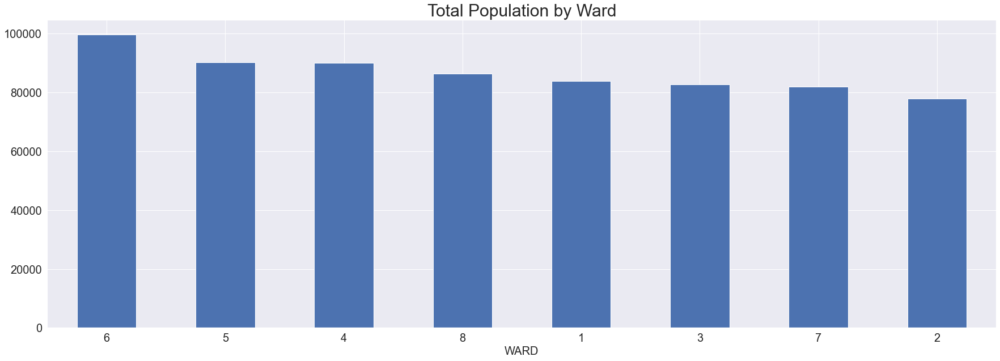

In [480]:
dc_ward[dc_ward.columns[:-1]].set_index('WARD')['TOTAL POPULATION'].sort_values(ascending=False).plot.bar()

plt.title('Total Population by Ward', fontsize=30)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20,rotation=0)
plt.xlabel("WARD", fontsize=20)

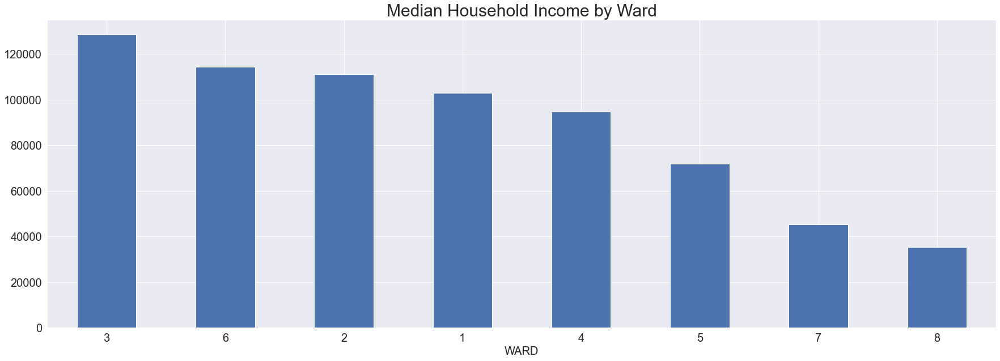

---------------------------------------------------------------------------------------------------- 

---------------------------------------------------------------------------------------------------- 



Text(0.5, 0, 'WARD')

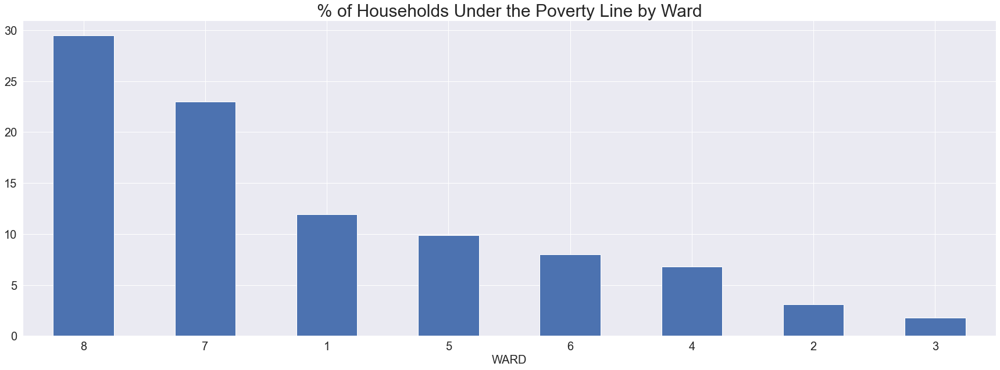

In [481]:
dc_ward[dc_ward.columns[:-1]].set_index('WARD')['MEDIAN_HOUSEHOLD_INCOME'].sort_values(ascending=False).plot.bar()

plt.title('Median Household Income by Ward', fontsize=30)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20,rotation=0)
plt.xlabel("WARD", fontsize=20)
plt.show()
print('-----'*20,'\n')
print('-----'*20,'\n')
dc_ward[dc_ward.columns[:-1]].set_index('WARD')['PCT_FAM_UNDER_POV'].sort_values(ascending=False).plot.bar()

plt.title('% of Households Under the Poverty Line by Ward', fontsize=30)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20,rotation=0)
plt.xlabel("WARD", fontsize=20)

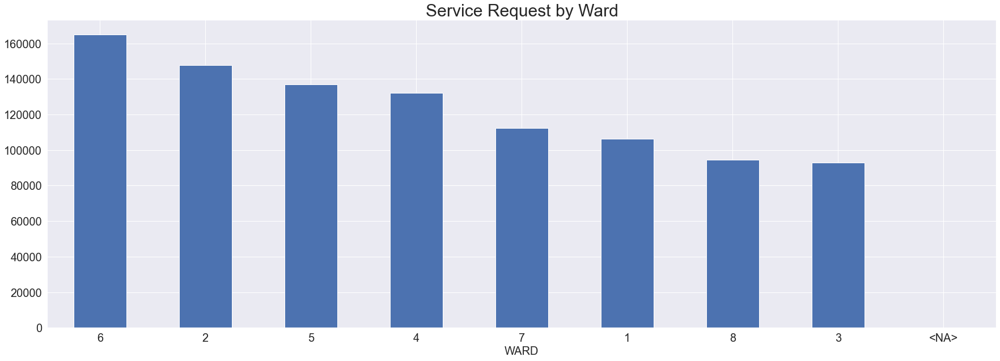

---------------------------------------------------------------------------------------------------- 

 Most of the requests are from Wards 6, 2, 5, 4; the least from Ward 3 and 8
---------------------------------------------------------------------------------------------------- 



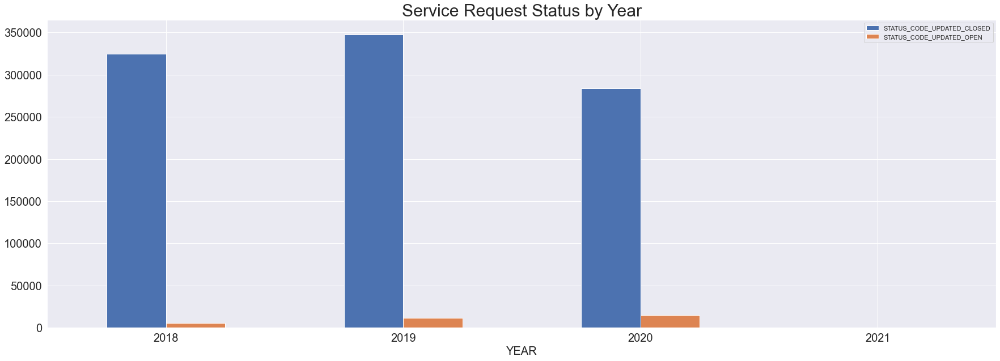

---------------------------------------------------------------------------------------------------- 

The Year over Year change from 2019 to 2020 was :  -0.16823691874223923
---------------------------------------------------------------------------------------------------- 



,STATUS_CODE_UPDATED_CLOSED,STATUS_CODE_UPDATED_OPEN
ADD_YEAR,,
2018,324594.0,5638.0
2019,347699.0,11479.0
2020,283596.0,15155.0
2021,26.0,4.0


In [482]:

data_311['WARD_UPDATED'].value_counts().plot.bar()
plt.title('Service Request by Ward', fontsize=30)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20,rotation=0)
# plt.xticks()
plt.xlabel("WARD", fontsize=20)
plt.show()
print('-----'*20,'\n')
print(' Most of the requests are from Wards 6, 2, 5, 4; the least from Ward 3 and 8')
print('-----'*20,'\n')


ward_status = pd.get_dummies(data_311[['ADD_YEAR', 'STATUS_CODE_UPDATED']], 'STATUS_CODE_UPDATED')
ward_requests= pd.get_dummies(data_311[['ADD_YEAR', 'WARD_UPDATED']], 'WARD_UPDATED')
ward_status =ward_status.groupby('ADD_YEAR', dropna=False).sum()
ward_requests = ward_requests.groupby('ADD_YEAR', dropna=False).sum()
ward_status.plot.bar()
plt.title('Service Request Status by Year', fontsize=30)


plt.yticks(fontsize=20)
plt.xticks(fontsize=20,rotation=0)
plt.xlabel('YEAR', fontsize=20)
plt.show()

print('-----'*20,'\n')
y_2019 =ward_status.loc[2019]['STATUS_CODE_UPDATED_CLOSED']+ward_status.loc[2019]['STATUS_CODE_UPDATED_OPEN']
y_2020 =ward_status.loc[2020]['STATUS_CODE_UPDATED_CLOSED']+ward_status.loc[2020]['STATUS_CODE_UPDATED_OPEN']       
                                                                                  
print( 'The Year over Year change from 2019 to 2020 was : ', (y_2020 - y_2019) / (y_2019))
print('-----'*20,'\n')

ward_status


# Step 4
## Question 2: Was there a reduction in service requests as a result of COVID-19 Stay at Home Orders?
- There was a 16% reduction in the number of service requests in 2020 from 2019. The greatest decrease in service requests from 2019 to 2020 was in Ward 2:  -0.48045296167247387. Ward 2 is predominantly in the business district of D.C. where most of the federal buildings and office space is located.


---------------------------------------------------------------------------------------------------- 

The greatest decrease in service requests from 2019 to 2020 was in Ward 2:  -0.48045296167247387
Ward 2 is predominantly in the business district of D.C. where most of the federal buildings and office space is located
Ward 4 (Norhteast) and 8 (Southwest) had a slight increase of requests from 2019 to 2020
---------------------------------------------------------------------------------------------------- 



ADD_YEAR,2018,2019,2020,2021
WARD_UPDATED_1,36354.0,38889.0,31125.0,3.0
WARD_UPDATED_2,60696.0,57400.0,29822.0,4.0
WARD_UPDATED_3,31897.0,32537.0,28471.0,3.0
WARD_UPDATED_4,42488.0,44456.0,45150.0,11.0
WARD_UPDATED_5,43422.0,48771.0,44891.0,2.0
WARD_UPDATED_6,54838.0,61989.0,48308.0,3.0
WARD_UPDATED_7,36051.0,41172.0,35024.0,3.0
WARD_UPDATED_8,24482.0,33958.0,35951.0,1.0
WARD_UPDATED_<NA>,4.0,6.0,9.0,0.0


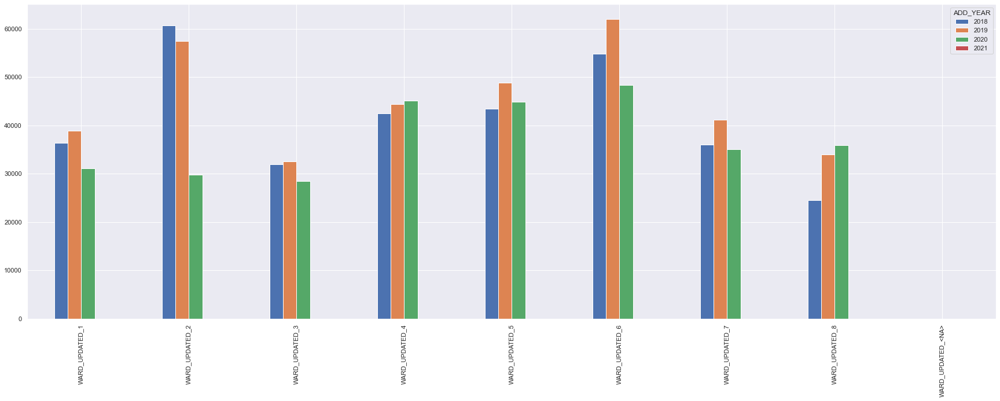

In [483]:
print('-----'*20,'\n')
print( 'The greatest decrease in service requests from 2019 to 2020 was in Ward 2: ', (ward_requests.T.loc['WARD_UPDATED_2'][2020] - ward_requests.T.loc['WARD_UPDATED_2'][2019]) / ward_requests.T.loc['WARD_UPDATED_2'][2019])
print( 'Ward 2 is predominantly in the business district of D.C. where most of the federal buildings and office space is located')
print('Ward 4 (Norhteast) and 8 (Southwest) had a slight increase of requests from 2019 to 2020')
print('-----'*20,'\n')
# ward_requests.plot.bar()
# plt.yticks(fontsize=15)
# plt.xticks(fontsize=15,rotation=0) 
# plt.show()

ward_requests.T.plot.bar()

ward_requests.T

# Step 4 
## Question 3: Has there been a change in the duration to complete a service request in calendar year 2020?* 

## DATA EXPLORATION --  REQUEST DATE to RESOLUTION DATE BY YEAR (n=days)


- In 2020, 95% of service requests were completed within 70 days, wheareas in 2019 
95% of requests were done within 135 days, 182 in 2018    

- Overall, 75% of requests were completed within 14 days, in par with previous years

- The average number of days to complete a service in 2020 was 15, compared to 23 in 2019 and 35 in 2018 
- Service days have been decreasing since 2018 so it is difficult to assess if the decrease in days is due to changes in 2020 alone



*excludes open tickets




In [484]:
data_311.groupby(['ADD_YEAR'])['SERVICE_DAYS'].describe(percentiles=[0.05,.25,.50,.75,.85,.90, .95,.99])

,count,mean,std,min,5%,25%,50%,75%,85%,90%,95%,99%,max
ADD_YEAR,,,,,,,,,,,,,
2018,324594.0,35.630828,107.690300,0.0,0.0,0.0,4.0,13.0,39.0,88.0,182.00,595.0,1184.0
2019,347695.0,23.377820,75.228188,0.0,0.0,0.0,3.0,11.0,19.0,33.0,135.00,422.0,815.0
2020,283585.0,15.717355,39.603893,0.0,0.0,0.0,5.0,14.0,19.0,27.0,70.00,231.0,450.0
2021,26.0,4.000000,2.653300,0.0,0.0,3.0,4.0,5.0,6.0,6.5,9.25,10.0,10.0


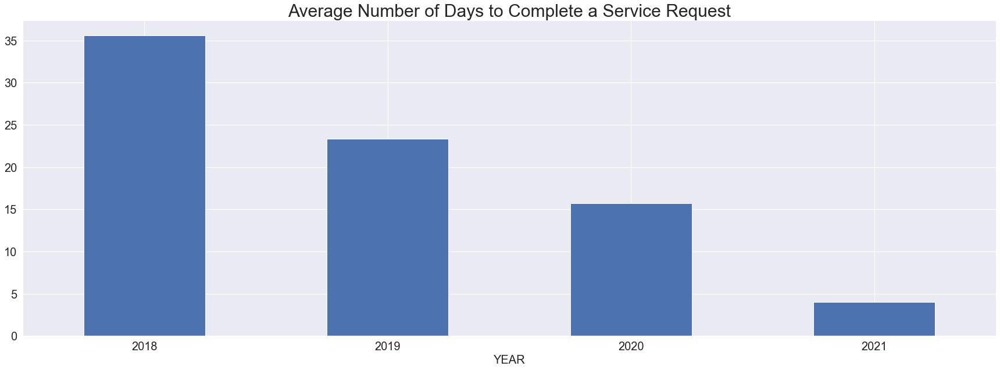

ADD_YEAR
2018    35.630828
2019    23.377820
2020    15.717355
2021     4.000000
Name: SERVICE_DAYS, dtype: float64

In [485]:
data_311.groupby(['ADD_YEAR'])['SERVICE_DAYS'].mean().plot.bar()
plt.title('Average Number of Days to Complete a Service Request', fontsize=30)


plt.yticks(fontsize=20)
plt.xticks(fontsize=20,rotation=0)
plt.xlabel('YEAR', fontsize=20)
plt.show()
data_311.groupby(['ADD_YEAR'])['SERVICE_DAYS'].mean()

# Step 4 
## Question4:  Has there been a change in the number of days to complete an inspection of a service request in 2020? 

## DATA EXPLORATION --  REQUEST DATE to INSPECTION DAY BY YEAR (n=days)

- Not a major change or difference in the number of days to complete an inspection when an inspection was required from year to year

- 95% of inspections were completed within 16 days in 2020, 13 days in 2019, 15 days in 2018


In [486]:
data_311[data_311.INSPECTIONFLAG_UPDATED==1].groupby(['ADD_YEAR'])['INSPECTION_DAYS'].describe(percentiles=[0, 0.25, 0.5, 0.75,.85, 0.95, 1])



,count,mean,std,min,0%,25%,50%,75%,85%,95%,100%,max
ADD_YEAR,,,,,,,,,,,,
2018,26323.0,9.169662,49.164469,-1.0,-1.0,1.0,2.0,5.0,7.0,15.0,701.0,701.0
2019,25698.0,5.329792,19.795982,-1.0,-1.0,1.0,2.0,4.0,5.0,13.0,452.0,452.0
2020,18545.0,5.223942,18.463141,0.0,0.0,1.0,2.0,5.0,6.0,16.8,399.0,399.0
2021,5.0,5.800000,3.633180,1.0,1.0,5.0,5.0,7.0,8.6,10.2,11.0,11.0


# Step 4 
## Question 5: Is there a difference in the number of days it takes to resolve a request by ward? 

## DATA EXPLORATION REQUEST DATE to RESOLUTION DATE BY WARD (n=days)
    
- At the 95th percentile, the days to resolve issues range from a low 104 days in Ward 8 to a high 146 days in Ward  3

- Service requests in Ward 8 have taken on average less days to complete than any other Ward even when comparing by year requested but not by a large difference



In [487]:
pd.DataFrame(data_311.groupby(['WARD_UPDATED'])['SERVICE_DAYS'].describe(percentiles=[0.05,.25,.50,.75,.85,.90, .95,.99]))
# data_311.groupby(['ADD_YEAR','WARD_UPDATED'])['SERVICE_DAYS'].describe(percentiles=[0.05,.25,.50,.75,.85,.90, .95,.99])

,count,mean,std,min,5%,25%,50%,75%,85%,90%,95%,99%,max
WARD_UPDATED,,,,,,,,,,,,,
1,103607.0,24.226867,78.989222,0.0,0.0,0.0,3.0,12.0,20.00,41.0,125.00,435.00,1158.0
2,141973.0,29.599593,91.366045,0.0,0.0,0.0,1.0,11.0,39.00,80.0,139.00,503.00,1155.0
3,88064.0,29.446357,89.370325,0.0,0.0,0.0,4.0,14.0,25.00,64.0,146.00,503.00,1180.0
4,127501.0,25.851240,81.573797,0.0,0.0,1.0,5.0,12.0,21.00,42.0,135.00,443.00,1168.0
5,132737.0,25.883371,81.311023,0.0,0.0,0.0,5.0,14.0,21.00,40.0,132.00,455.00,1163.0
6,159822.0,23.672066,80.342552,0.0,0.0,0.0,3.0,11.0,18.00,33.0,120.00,452.79,1121.0
7,109697.0,22.033210,67.475578,0.0,0.0,1.0,6.0,14.0,20.00,32.0,107.00,368.00,1184.0
8,92481.0,20.682173,68.871484,0.0,0.0,0.0,3.0,11.0,18.00,31.0,104.00,372.00,1096.0
<NA>,18.0,49.555556,120.456593,1.0,1.0,5.0,21.0,38.5,48.75,57.6,129.05,446.61,526.0


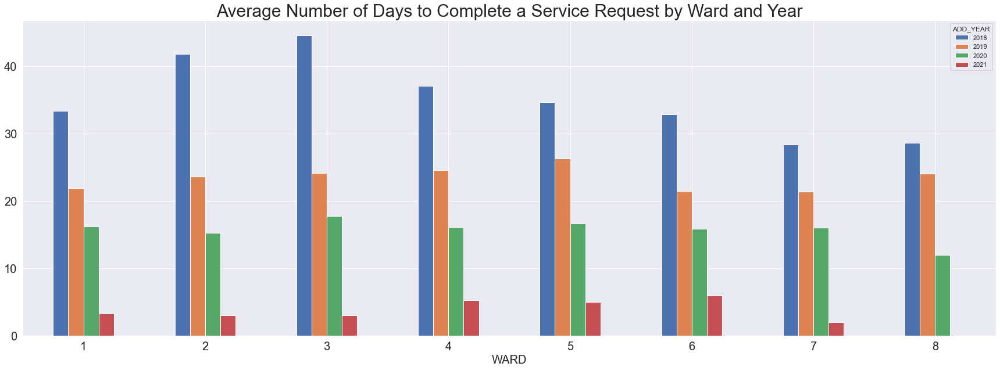

ADD_YEAR,2018,2019,2020,2021
WARD_UPDATED,,,,
1,33.344893,21.891362,16.219514,3.333333
2,41.757614,23.605732,15.310715,3.000000
3,44.584311,24.132884,17.730651,3.000000
4,37.080262,24.605719,16.141218,5.250000
5,34.652504,26.321583,16.642622,5.000000
6,32.824280,21.450051,15.865502,6.000000
7,28.400728,21.417785,16.023899,2.000000
8,28.625454,24.048584,11.970217,0.000000


In [488]:
WARD_SERVICE_AVG=pd.DataFrame(data_311.groupby(['ADD_YEAR','WARD_UPDATED'])['SERVICE_DAYS'].mean().reset_index())


WARD_SERVICE_AVG[WARD_SERVICE_AVG['WARD_UPDATED']!='<NA>'].pivot(index='WARD_UPDATED', columns='ADD_YEAR', values='SERVICE_DAYS').plot.bar()
plt.title('Average Number of Days to Complete a Service Request by Ward and Year', fontsize=30)


plt.yticks(fontsize=20)
plt.xticks(fontsize=20,rotation=0)
plt.xlabel('WARD', fontsize=20)
plt.show()

WARD_SERVICE_AVG[WARD_SERVICE_AVG['WARD_UPDATED']!='<NA>'].pivot(index='WARD_UPDATED', columns='ADD_YEAR', values='SERVICE_DAYS')

# Step 4 
## SERVICE DAYS by SERVICE CODE and WARD

## Question 6: Is there a difference in the type of request by Ward? 
The majority of service code request types in D.C. are The majority of Service Codes are solid waste, parking, transportation, and urban forestry service requests.

- The majority of Service Codes are Solid Waste, parking, transportation, and urban forrestry service requests

## Question 7: Is there a difference in the time it takes to resolve a  type of request by Ward ?
- There is not a major difference in the number of days to complete by Service by Service Code and by Ward


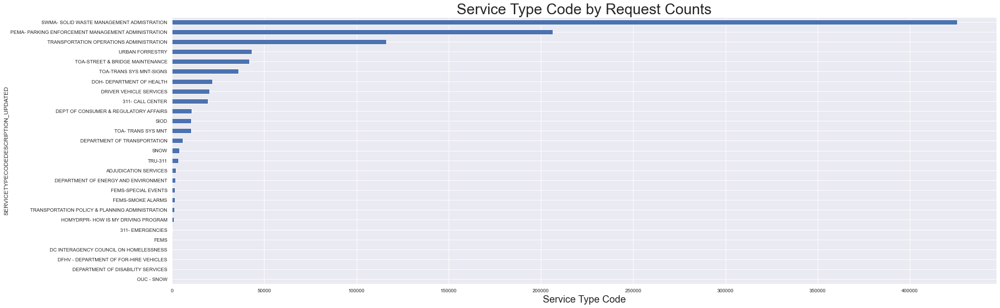

In [489]:
service_type=pd.DataFrame(data_311.groupby('SERVICETYPECODEDESCRIPTION_UPDATED')['SERVICECALLCOUNT'].describe(percentiles=[0.05,.25,.50,.75,.85,.90, .95,.99])).sort_values(by=['count'], ascending=True)
# SERVICECODEDESCRIPTION_UPDATED
service_type['count'].plot.barh()
plt.title('Service Type Code by Request Counts', fontsize=30)


plt.yticks(fontsize=10)
plt.xticks(fontsize=10)
plt.xlabel('Service Type Code', fontsize=20)
plt.show()

## SERVICE CODE DESCRIPTION BY WARD 
<!-- service_code.loc['8'].sort_values(ascending=False).head(5) -->
- the top request for the district are Bulk Collection, Parking Enforcement, and Trash Collection
- are there some services that are more prevalent in certain WARDS? Predominantly parking enforcement,trash and bulk collection related requests
- Top Service Code Requests 
           Ward 1: BULK COLLECTION, PARKING ENFORCEMENT, EMERGENCY NO-PARKING VERIFICATION
           Ward 2: PARKING METER REPAIR, PARKING ENFORCEMENT, EMERGENCY NO-PARKING VERIFICATION 
           Ward 3: BULK COLLECTION,  PARKING METER REPAIR, PARKING ENFORCEMENT
           Ward 4: BULK COLLECTION, PARKING ENFORCEMENT, STREETLIGHT REPAIR INVESTIGATION
           Ward 5: BULK COLLECTION, PARKING ENFORCEMENT, TRASH COLLECTION - MISSED
           Ward 6: BULK COLLECTION, PARKING ENFORCEMENT, PARKING METER REPAIR
           Ward 7: BULK COLLECTION, PARKING ENFORCEMENT, TRASH COLLECTION - MISSED
           Ward 8: BULK COLLECTION, DC GOVERNMENT INFORMATION , PARKING ENFORCEMENT


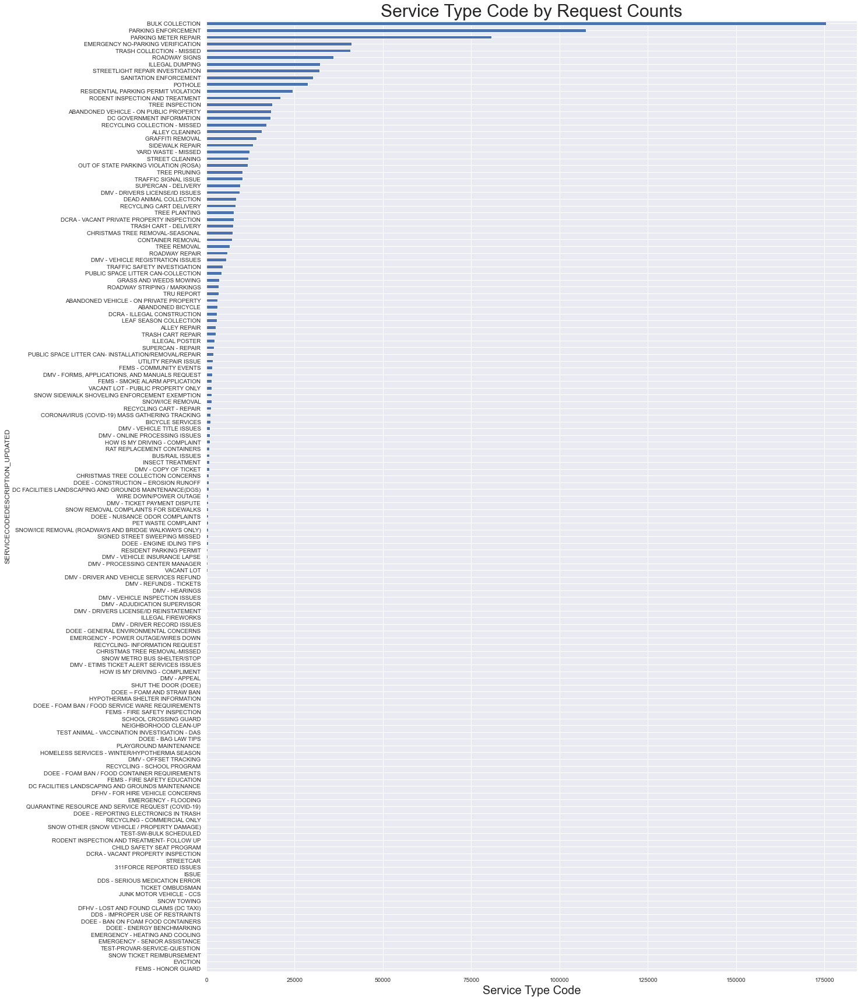

In [490]:
service_type=pd.DataFrame(data_311.groupby('SERVICECODEDESCRIPTION_UPDATED')['SERVICECALLCOUNT'].describe(percentiles=[0.05,.25,.50,.75,.85,.90, .95,.99])).sort_values(by=['count'], ascending=True)
# SERVICECODEDESCRIPTION_UPDATED
plt.figure(figsize=(20,30))
service_type['count'].plot.barh()
plt.title('Service Type Code by Request Counts', fontsize=30)


plt.yticks(fontsize=10)
plt.xticks(fontsize=10)
plt.xlabel('Service Type Code', fontsize=20)
plt.show()

In [491]:
#Service Code  by Ward 

mask=data_311[(data_311['WARD_UPDATED']!='<NA>')& (~data_311['SERVICECODEDESCRIPTION_UPDATED'].isna())]
service_code = pd.DataFrame(mask.groupby(['WARD_UPDATED','SERVICECODEDESCRIPTION_UPDATED'])['SERVICECODEDESCRIPTION_UPDATED'].count())#.reset_index()
service_code.columns=['count']
service_code =service_code.reset_index()

service_code=service_code.pivot(index='WARD_UPDATED', columns='SERVICECODEDESCRIPTION_UPDATED', values='count')#.plot.bar()
service_code

SERVICECODEDESCRIPTION_UPDATED,311FORCE REPORTED ISSUES,ABANDONED BICYCLE,ABANDONED VEHICLE - ON PRIVATE PROPERTY,ABANDONED VEHICLE - ON PUBLIC PROPERTY,ALLEY CLEANING,ALLEY REPAIR,BICYCLE SERVICES,BULK COLLECTION,BUS/RAIL ISSUES,CHILD SAFETY SEAT PROGRAM,CHRISTMAS TREE COLLECTION CONCERNS,CHRISTMAS TREE REMOVAL-MISSED,CHRISTMAS TREE REMOVAL-SEASONAL,CONTAINER REMOVAL,CORONAVIRUS (COVID-19) MASS GATHERING TRACKING,DC FACILITIES LANDSCAPING AND GROUNDS MAINTENANCE,DC FACILITIES LANDSCAPING AND GROUNDS MAINTENANCE(DGS),DC GOVERNMENT INFORMATION,DCRA - ILLEGAL CONSTRUCTION,DCRA - VACANT PRIVATE PROPERTY INSPECTION,DCRA - VACANT PROPERTY INSPECTION,DDS - IMPROPER USE OF RESTRAINTS,DDS - SERIOUS MEDICATION ERROR,DEAD ANIMAL COLLECTION,DFHV - FOR HIRE VEHICLE CONCERNS,DFHV - LOST AND FOUND CLAIMS (DC TAXI),DMV - ADJUDICATION SUPERVISOR,DMV - APPEAL,DMV - COPY OF TICKET,DMV - DRIVER AND VEHICLE SERVICES REFUND,DMV - DRIVER RECORD ISSUES,DMV - DRIVERS LICENSE/ID ISSUES,DMV - DRIVERS LICENSE/ID REINSTATEMENT,DMV - ETIMS TICKET ALERT SERVICES ISSUES,"DMV - FORMS, APPLICATIONS, AND MANUALS REQUEST",DMV - HEARINGS,DMV - OFFSET TRACKING,DMV - ONLINE PROCESSING ISSUES,DMV - PROCESSING CENTER MANAGER,DMV - REFUNDS - TICKETS,DMV - TICKET PAYMENT DISPUTE,DMV - VEHICLE INSPECTION ISSUES,DMV - VEHICLE INSURANCE LAPSE,DMV - VEHICLE REGISTRATION ISSUES,DMV - VEHICLE TITLE ISSUES,DOEE - BAG LAW TIPS,DOEE - BAN ON FOAM FOOD CONTAINERS,DOEE - CONSTRUCTION – EROSION RUNOFF,DOEE - ENERGY BENCHMARKING,DOEE - ENGINE IDLING TIPS,DOEE - FOAM BAN / FOOD CONTAINER REQUIREMENTS,DOEE - FOAM BAN / FOOD SERVICE WARE REQUIREMENTS,DOEE - GENERAL ENVIRONMENTAL CONCERNS,DOEE - NUISANCE ODOR COMPLAINTS,DOEE - REPORTING ELECTRONICS IN TRASH,DOEE – FOAM AND STRAW BAN,EMERGENCY - FLOODING,EMERGENCY - HEATING AND COOLING,EMERGENCY - POWER OUTAGE/WIRES DOWN,EMERGENCY - SENIOR ASSISTANCE,EMERGENCY NO-PARKING VERIFICATION,EVICTION,FEMS - COMMUNITY EVENTS,FEMS - FIRE SAFETY EDUCATION,FEMS - FIRE SAFETY INSPECTION,FEMS - HONOR GUARD,FEMS - SMOKE ALARM APPLICATION,GRAFFITI REMOVAL,GRASS AND WEEDS MOWING,HOMELESS SERVICES - WINTER/HYPOTHERMIA SEASON,HOW IS MY DRIVING - COMPLAINT,HOW IS MY DRIVING - COMPLIMENT,HYPOTHERMIA SHELTER INFORMATION,ILLEGAL DUMPING,ILLEGAL FIREWORKS,ILLEGAL POSTER,INSECT TREATMENT,ISSUE,JUNK MOTOR VEHICLE - CCS,LEAF SEASON COLLECTION,NEIGHBORHOOD CLEAN-UP,OUT OF STATE PARKING VIOLATION (ROSA),PARKING ENFORCEMENT,PARKING METER REPAIR,PET WASTE COMPLAINT,PLAYGROUND MAINTENANCE,POTHOLE,PUBLIC SPACE LITTER CAN- INSTALLATION/REMOVAL/REPAIR,PUBLIC SPACE LITTER CAN-COLLECTION,QUARANTINE RESOURCE AND SERVICE REQUEST (COVID-19),RAT REPLACEMENT CONTAINERS,RECYCLING - COMMERCIAL ONLY,RECYCLING - SCHOOL PROGRAM,RECYCLING CART - REPAIR,RECYCLING CART DELIVERY,RECYCLING COLLECTION - MISSED,RECYCLING- INFORMATION REQUEST,RESIDENT PARKING PERMIT,RESIDENTIAL PARKING PERMIT VIOLATION,ROADWAY REPAIR,ROADWAY SIGNS,ROADWAY STRIPING / MARKINGS,RODENT INSPECTION AND TREATMENT,RODENT INSPECTION AND TREATMENT- FOLLOW UP,SANITATION ENFORCEMENT,SCHOOL CROSSING GUARD,SHUT THE DOOR (DOEE),SIDEWALK REPAIR,SIGNED STREET SWEEPING MISSED,SNOW METRO BUS SHELTER/STOP,SNOW OTHER (SNOW VEHICLE / PROPERTY DAMAGE),SNOW REMOVAL COMPLAINTS FOR SIDEWALKS,SNOW SIDEWALK SHOVELING ENFORCEMENT EXEMPTION,SNOW TICKET REIMBURSEMENT,SNOW TOWING,SNOW/ICE REMOVAL,SNOW/ICE REMOVAL (ROADWAYS AND BRIDGE WALKWAYS ONLY),STREET CLEANING,STREETCAR,STREETLIGHT REPAIR INVESTIGATION,SUPERCAN - DELIVERY,SUPERCAN - REPAIR,TEST ANIMAL - VACCINATION INVESTIGATION - DAS,TEST-PROVAR-SERVICE-QUESTION,TEST-SW-BULK SCHEDULED,TICKET OMBUDSMAN,TRAFFIC SAFETY INVESTIGATION,TRAFFIC SIGNAL ISSUE,TRASH CART - DELIVERY,TRASH CART REPAIR,TRASH COLLECTION - MISSED,TREE INSPECTION,TREE PLANTING,TREE PRUNING,TREE REMOVAL,TRU REPORT,UTILITY REPAIR ISSUE,VACANT LOT,VACANT LOT - PUBLIC PROPERTY ONLY,WIRE DOWN/POWER OUTAGE,YARD WASTE - MISSED
WARD_UPDATED,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,

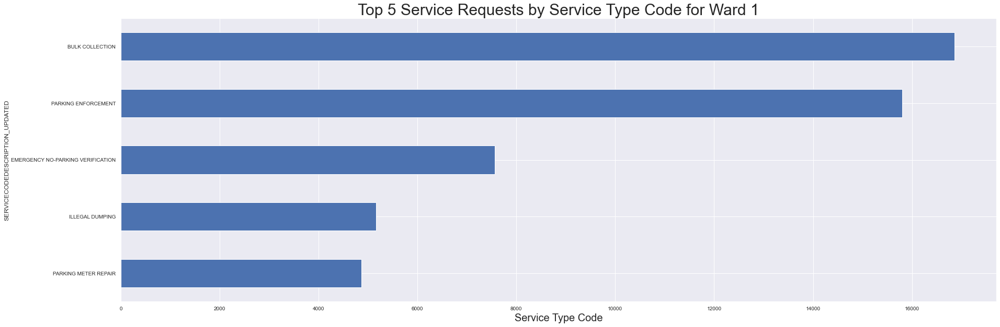

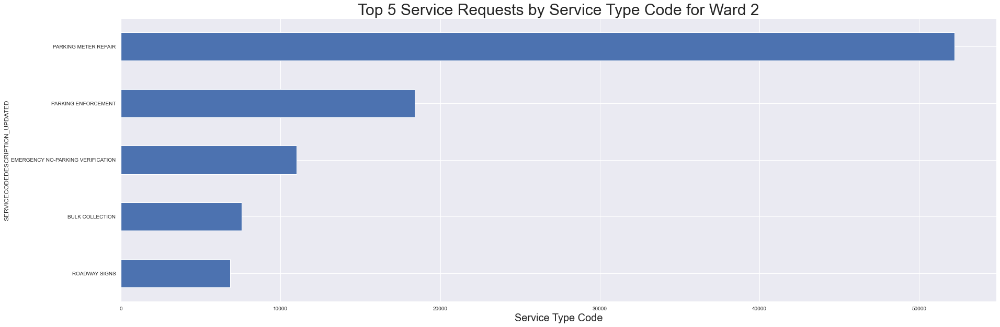

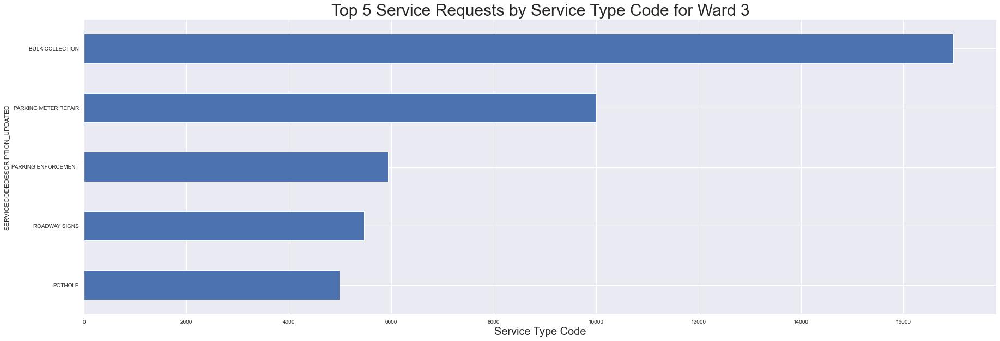

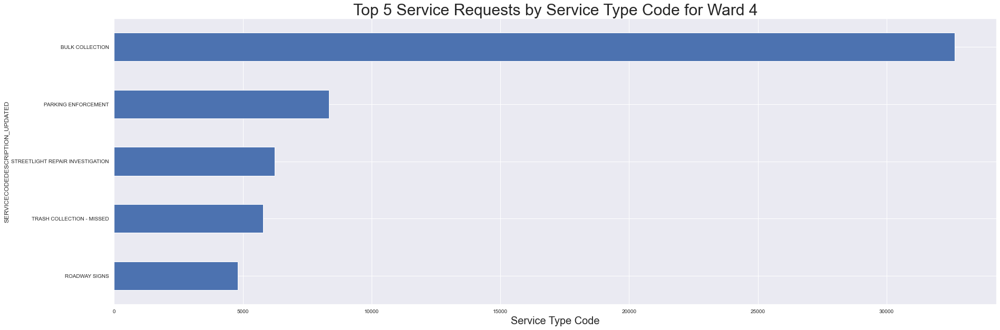

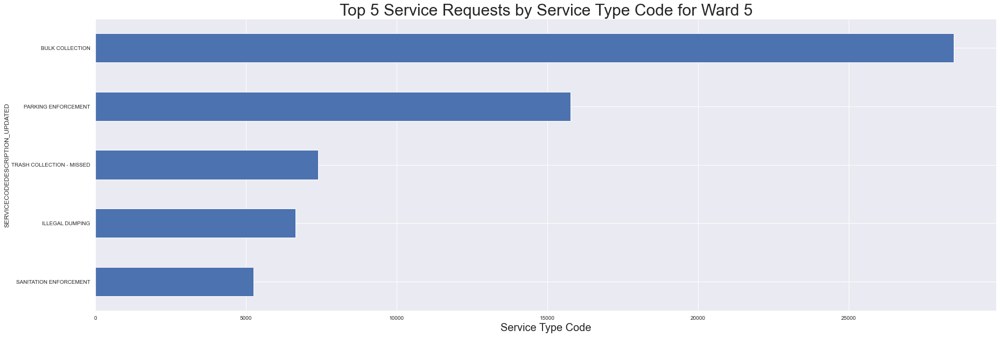

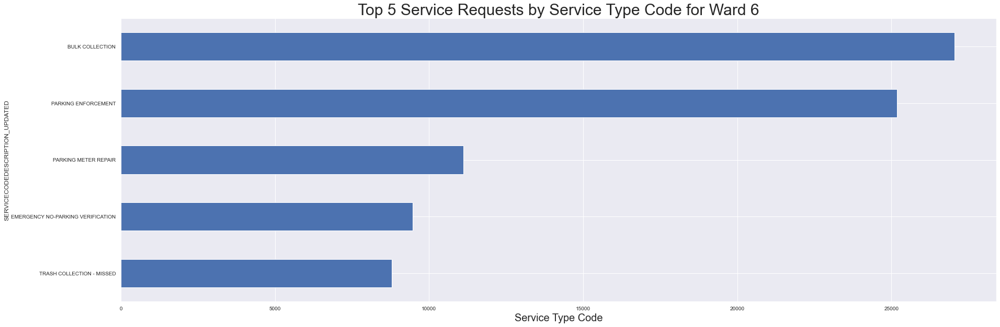

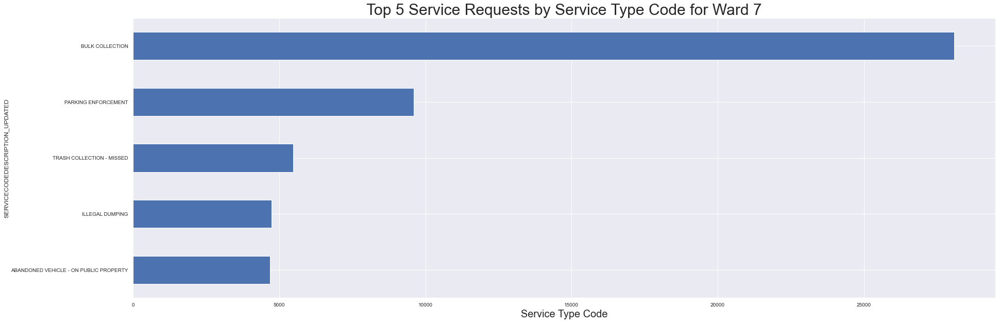

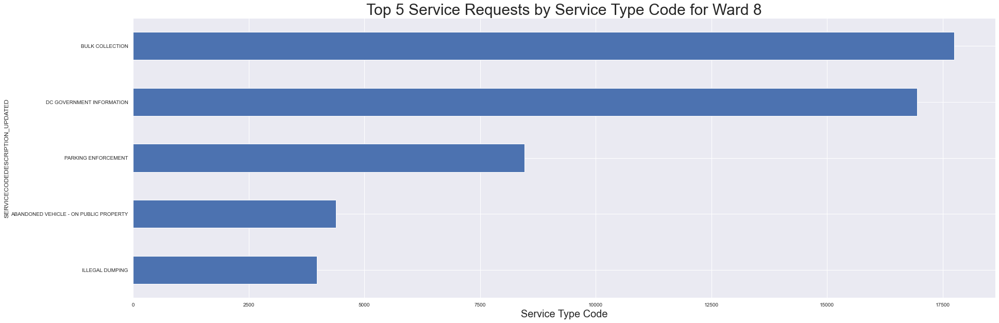

In [492]:
#Top 3 Service Code by Ward

for i in service_code.index:
    service_code.loc[str(i)].sort_values(ascending=False).head(5).sort_values(ascending=True).plot.barh()

    plt.title('Top 5 Service Requests by Service Type Code for Ward ' + str(i), fontsize=30)


    plt.yticks(fontsize=10)
    plt.xticks(fontsize=10)
    plt.xlabel('Service Type Code', fontsize=20)
    plt.show()

# Step 4
## Question 7: Is there a difference in the time it takes to resolve a  type of request by Ward ?

- Based on the box plote there is no difference in the number of days to complete a service request by ward
- There are some service types that take more time to complete but there are no differences by ward


---------------------------------------------------------------------------------------------------- 

---------------------------------------------------------------------------------------------------- 



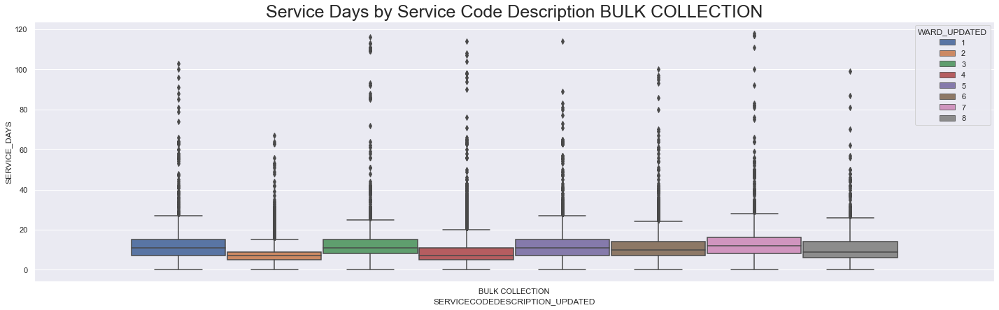

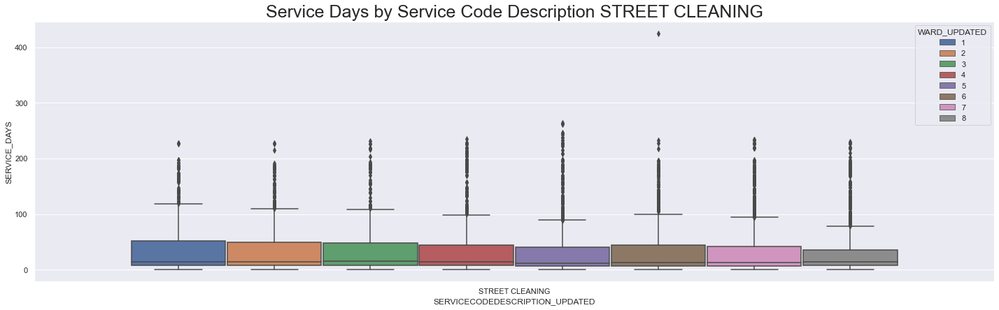

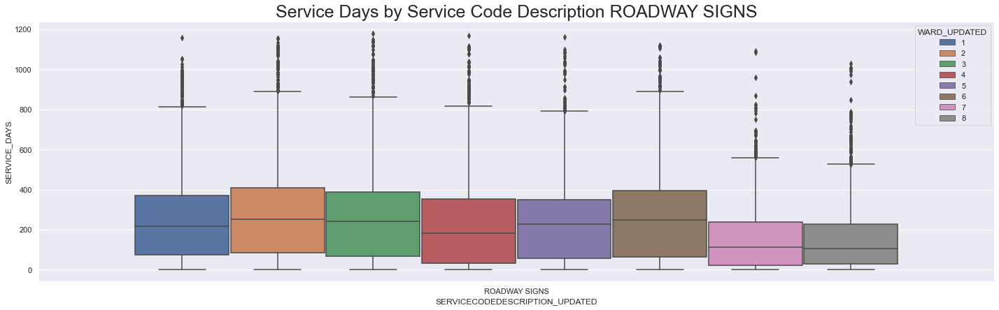

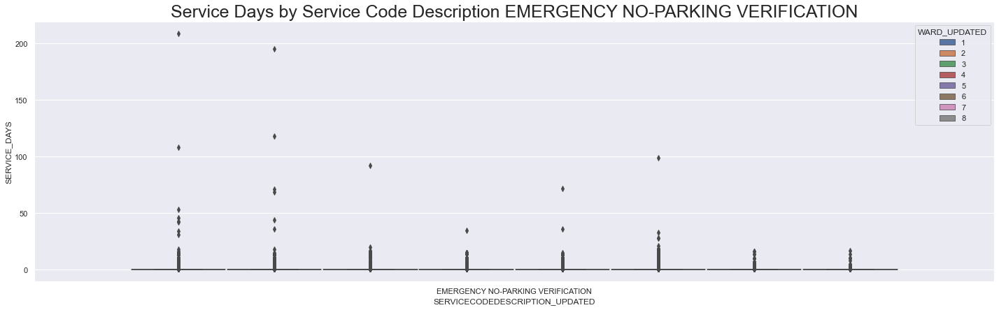

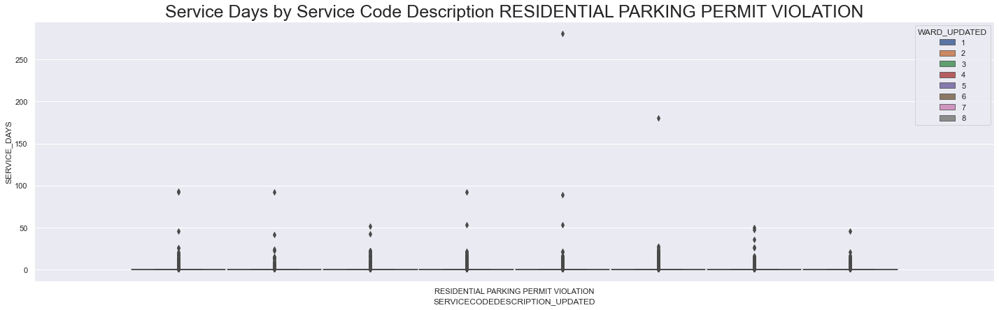

...

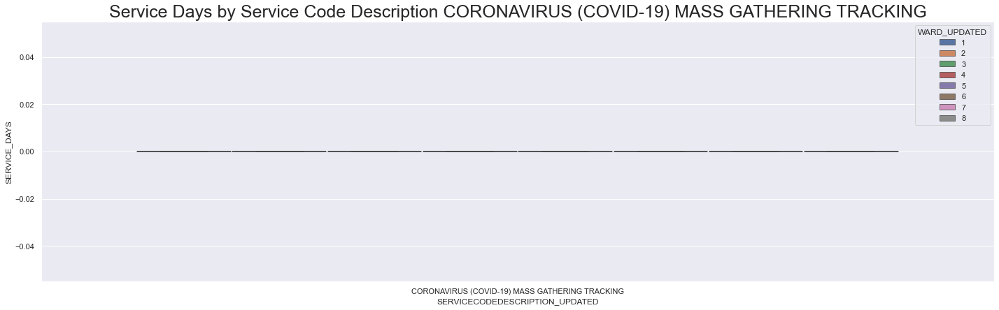

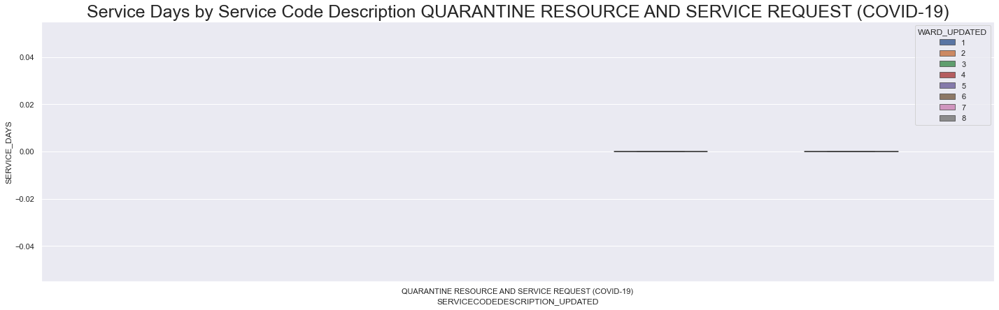

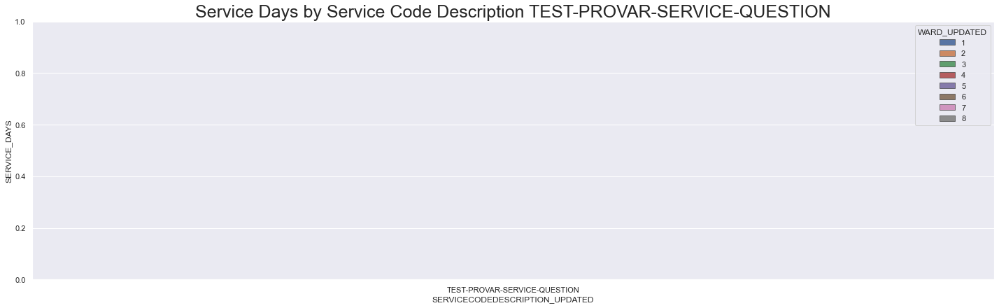

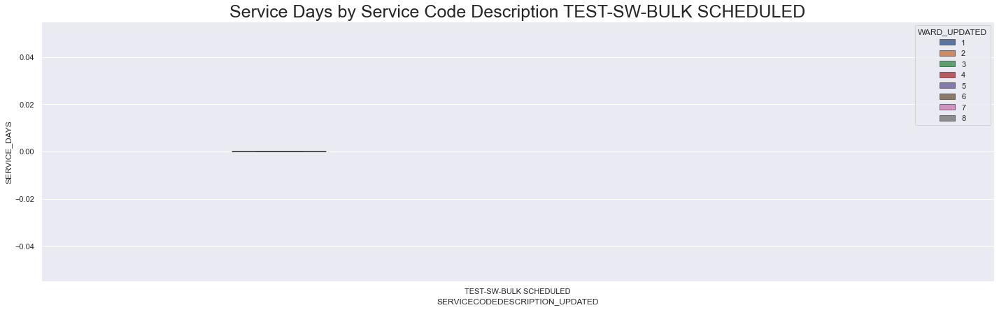

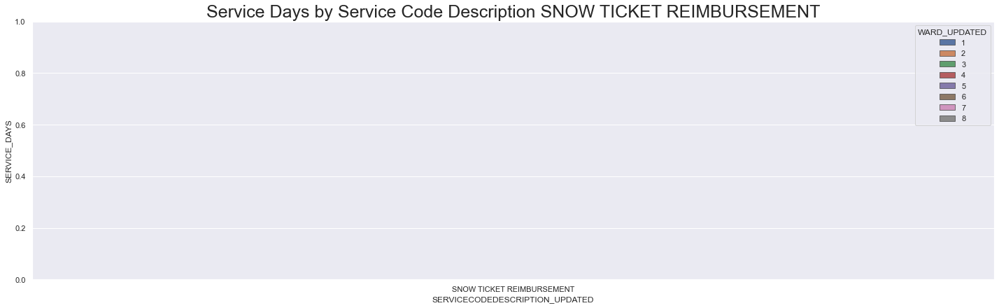

In [493]:

print('-----'*20,'\n')
print('-----'*20,'\n')
mask= data_311[(data_311['WARD_UPDATED']!='<NA>')& (~data_311['SERVICECODEDESCRIPTION_UPDATED'].isna()) ]
for i in mask['SERVICECODEDESCRIPTION_UPDATED'].unique():
#     print(i)
    sns.set(rc={'figure.figsize':(20,6)})
    sns.boxplot(x=mask[mask['SERVICECODEDESCRIPTION_UPDATED']==i]['SERVICECODEDESCRIPTION_UPDATED'], y='SERVICE_DAYS', 
                data=mask,  hue='WARD_UPDATED',hue_order=['1','2','3','4','5','6','7','8'])
    plt.xticks(rotation=0)
    plt.tight_layout()
    plt.title('Service Days by Service Code Description ' + i, fontdict={'fontsize':25})
    plt.show()

# SERVICE DAYS by SERVICE TYPE and WARD

- There is not a major difference in the number of days to complete a service request by Service Type by Ward


---------------------------------------------------------------------------------------------------- 

---------------------------------------------------------------------------------------------------- 



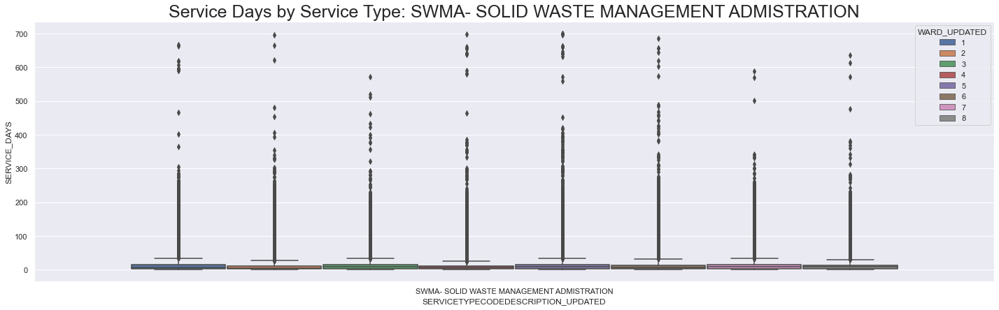

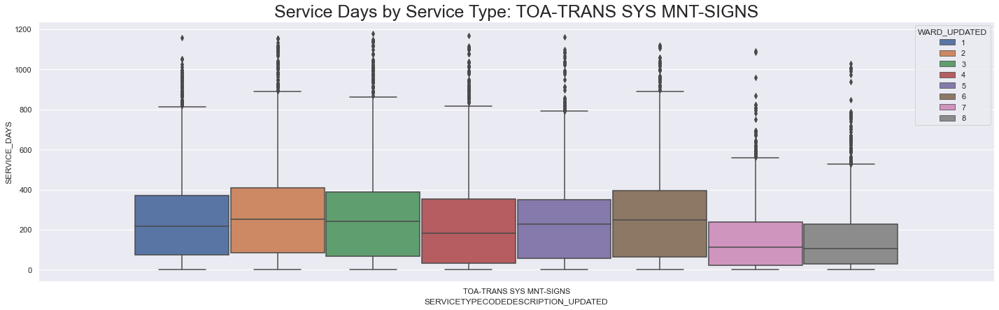

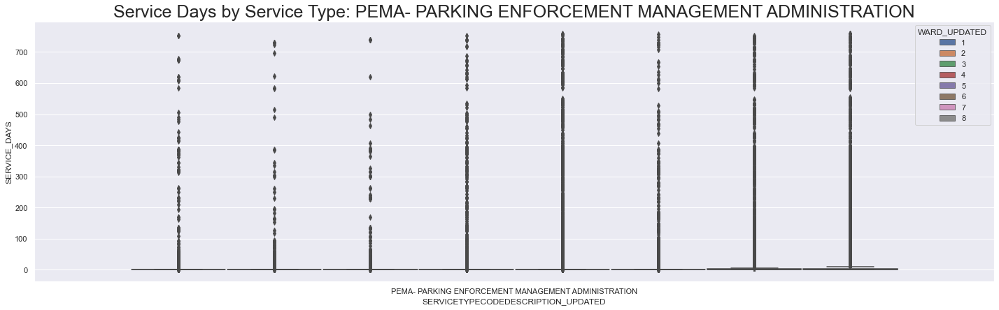

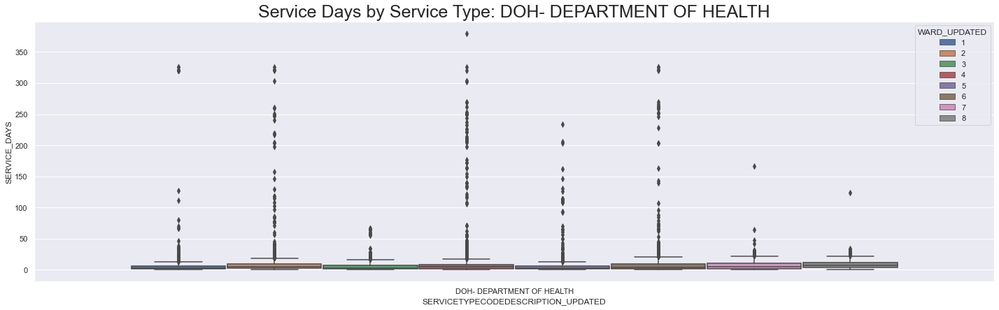

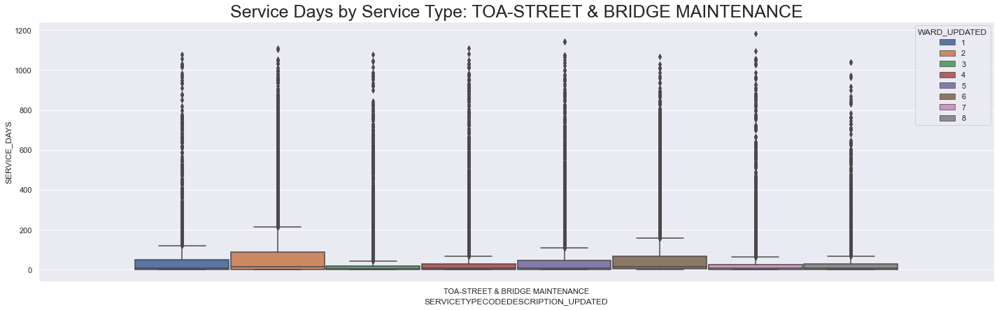

...

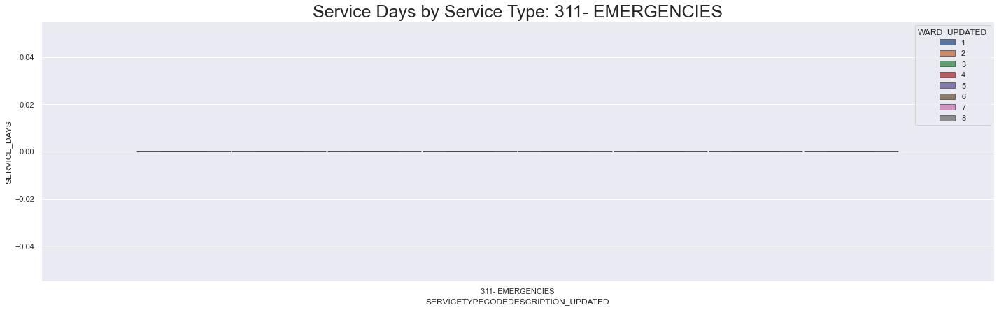

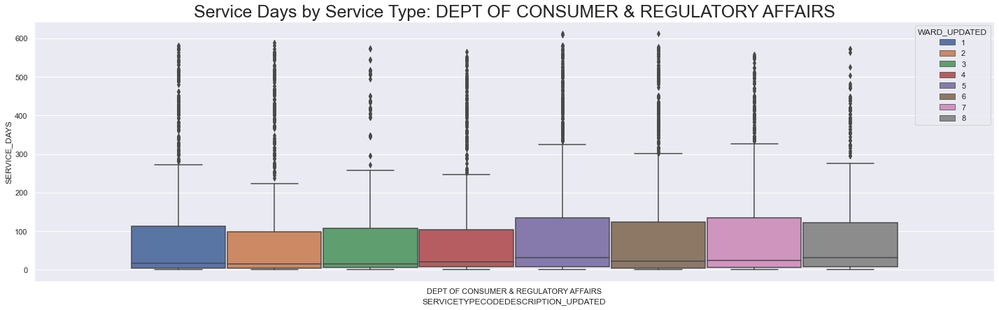

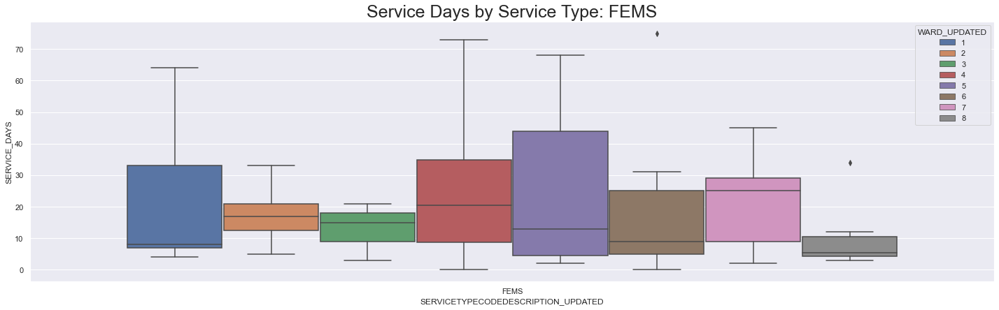

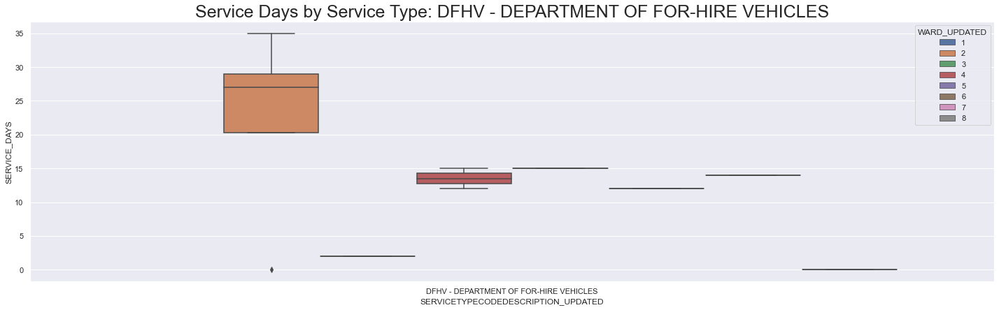

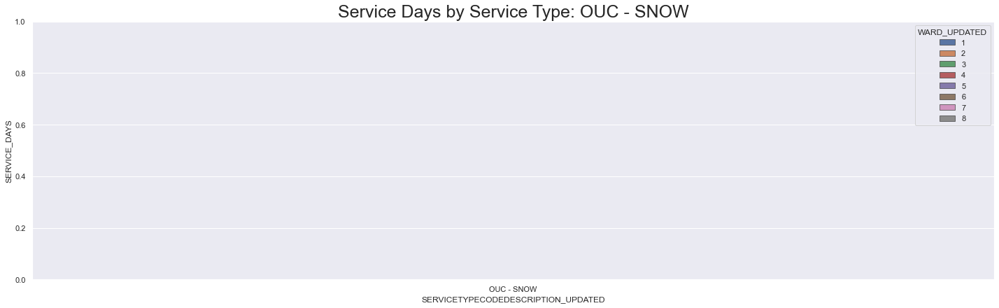

In [494]:
# SERVICE TYPE


print('-----'*20,'\n')
print('-----'*20,'\n')
mask= data_311[(data_311['WARD_UPDATED']!='<NA>')& (~data_311['SERVICETYPECODEDESCRIPTION_UPDATED'].isna()) ]
for i in mask['SERVICETYPECODEDESCRIPTION_UPDATED'].unique():
#     print(i)
    sns.set(rc={'figure.figsize':(20,6)})
    sns.boxplot(x=mask[mask['SERVICETYPECODEDESCRIPTION_UPDATED']==i]['SERVICETYPECODEDESCRIPTION_UPDATED'], y='SERVICE_DAYS', 
                data=mask,  hue='WARD_UPDATED',hue_order=['1','2','3','4','5','6','7','8'])
    plt.xticks(rotation=0)
    plt.tight_layout()
    plt.title('Service Days by Service Type: ' + i, fontdict={'fontsize':25})
    plt.show()

# SERVICE DAYS by SERVICE ORGANIZATION and DAYS

- But there is not a major difference in the number of days to complete a service by Service Agency by Ward


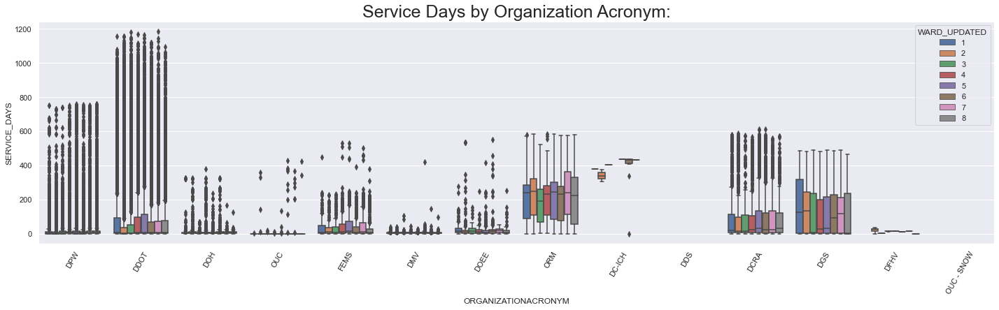

---------------------------------------------------------------------------------------------------- 

---------------------------------------------------------------------------------------------------- 



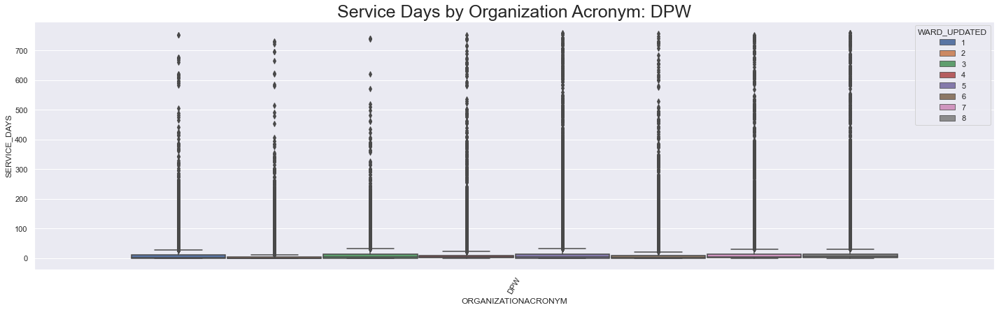

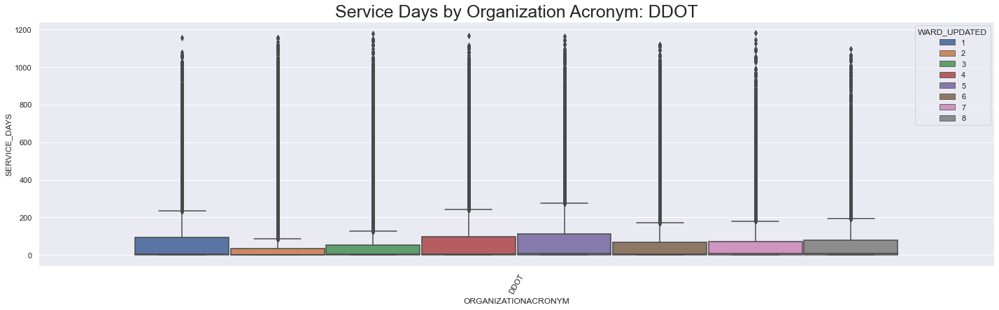

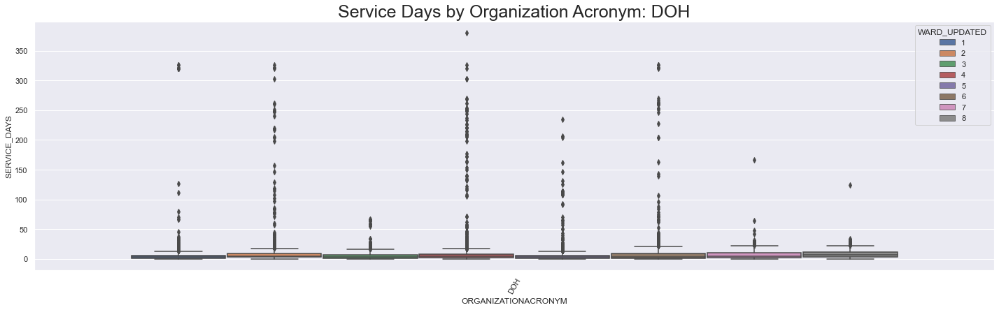

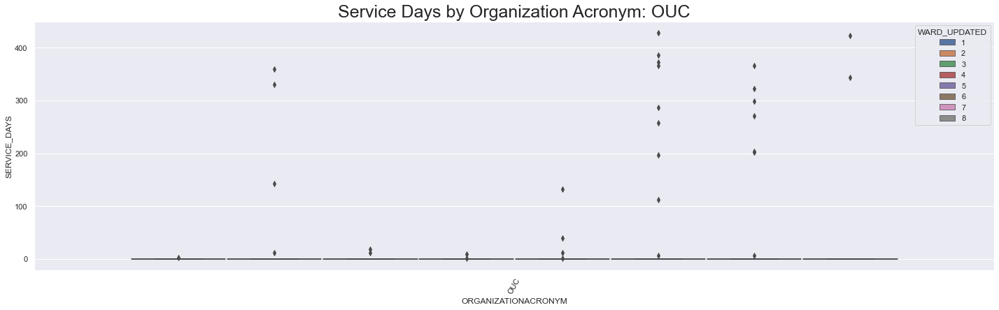

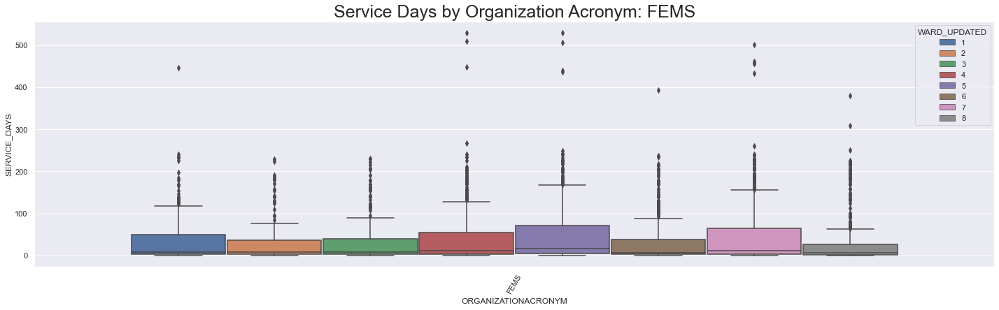

...

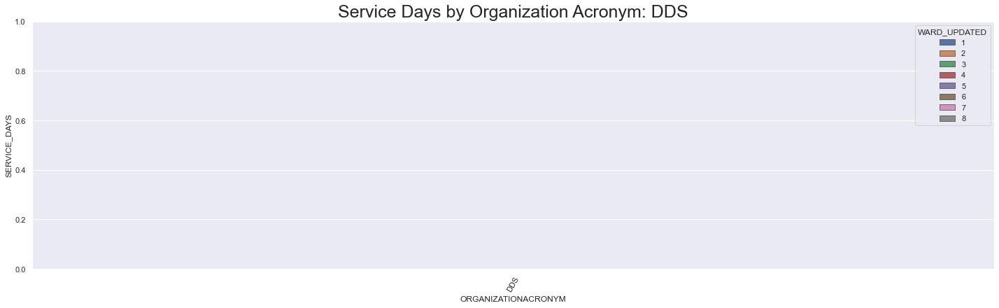

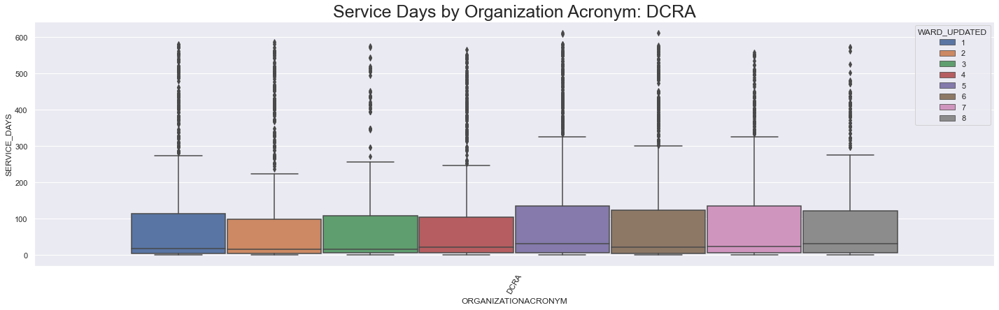

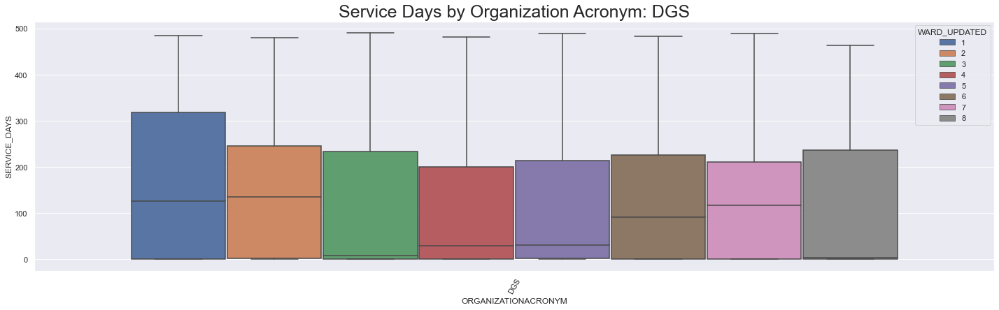

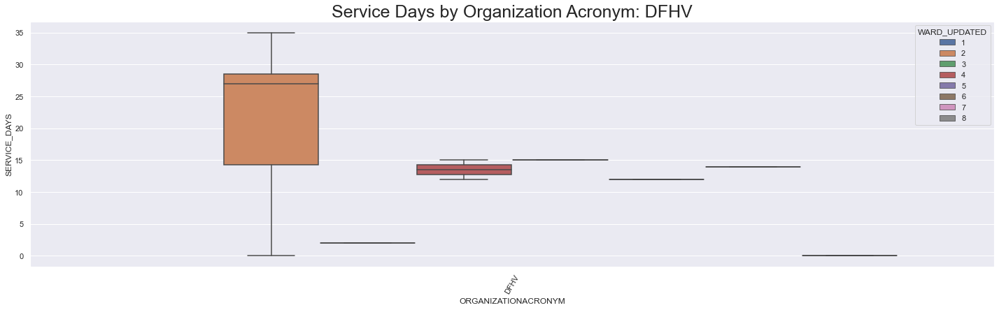

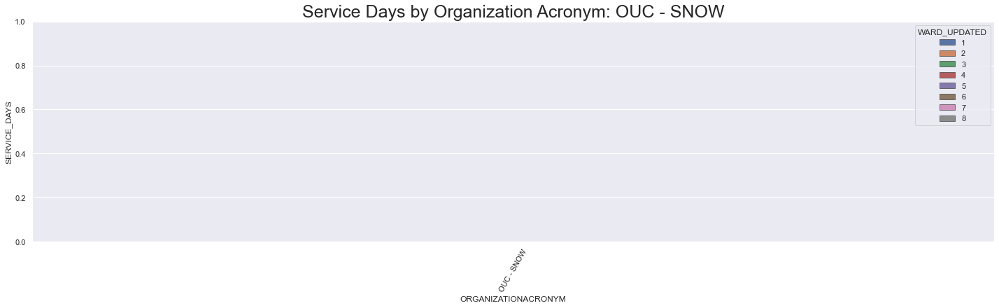

In [495]:
# SERVICE BY ORGANIZATION TYPE


sns.set(rc={'figure.figsize':(20,6)})
sns.boxplot(x=data_311[(data_311['WARD_UPDATED']!='<NA>') & (~data_311['ORGANIZATIONACRONYM'].isna() )  ]['ORGANIZATIONACRONYM'], y='SERVICE_DAYS', data=data_311[(data_311['WARD_UPDATED']!='<NA>') & (~data_311['ORGANIZATIONACRONYM'].isna() )  ],  hue='WARD_UPDATED',hue_order=['1','2','3','4','5','6','7','8'])
plt.xticks(rotation=60)
plt.tight_layout()
plt.title('Service Days by Organization Acronym:', fontdict={'fontsize':25})
plt.show()
print('-----'*20,'\n')
print('-----'*20,'\n')
for i in data_311[(data_311['WARD_UPDATED']!='<NA>') & (~data_311['ORGANIZATIONACRONYM'].isna() )  ]['ORGANIZATIONACRONYM'].unique():
    sns.set(rc={'figure.figsize':(20,6)})
    sns.boxplot(x=data_311[data_311['ORGANIZATIONACRONYM']==i]['ORGANIZATIONACRONYM'], y='SERVICE_DAYS', data=data_311[(data_311['WARD_UPDATED']!='<NA>') & (~data_311['ORGANIZATIONACRONYM'].isna() )  ],  hue='WARD_UPDATED',hue_order=['1','2','3','4','5','6','7','8'])
    plt.xticks(rotation=60)
    plt.tight_layout()
    plt.title('Service Days by Organization Acronym: ' + i, fontdict={'fontsize':25})
    plt.show()


## SERVICE CODE DESCRIPTION BY WARD 
<!-- service_code.loc['8'].sort_values(ascending=False).head(5) -->
- the top request for the district are Bulk Collection, Parking Enforcement, and Trash Collection
- are there some services that are more prevalent in certain WARDS? Predominantly parking enforcement,trash and bulk collection related requests
- Top Service Code Requests 
           Ward 1: BULK COLLECTION, PARKING ENFORCEMENT, EMERGENCY NO-PARKING VERIFICATION
           Ward 2: PARKING METER REPAIR, PARKING ENFORCEMENT, EMERGENCY NO-PARKING VERIFICATION 
           Ward 3: BULK COLLECTION,  PARKING METER REPAIR, PARKING ENFORCEMENT
           Ward 4: BULK COLLECTION, PARKING ENFORCEMENT, STREETLIGHT REPAIR INVESTIGATION
           Ward 5: BULK COLLECTION, PARKING ENFORCEMENT, TRASH COLLECTION - MISSED
           Ward 6: BULK COLLECTION, PARKING ENFORCEMENT, PARKING METER REPAIR
           Ward 7: BULK COLLECTION, PARKING ENFORCEMENT, TRASH COLLECTION - MISSED
           Ward 8: BULK COLLECTION, DC GOVERNMENT INFORMATION , PARKING ENFORCEMENT



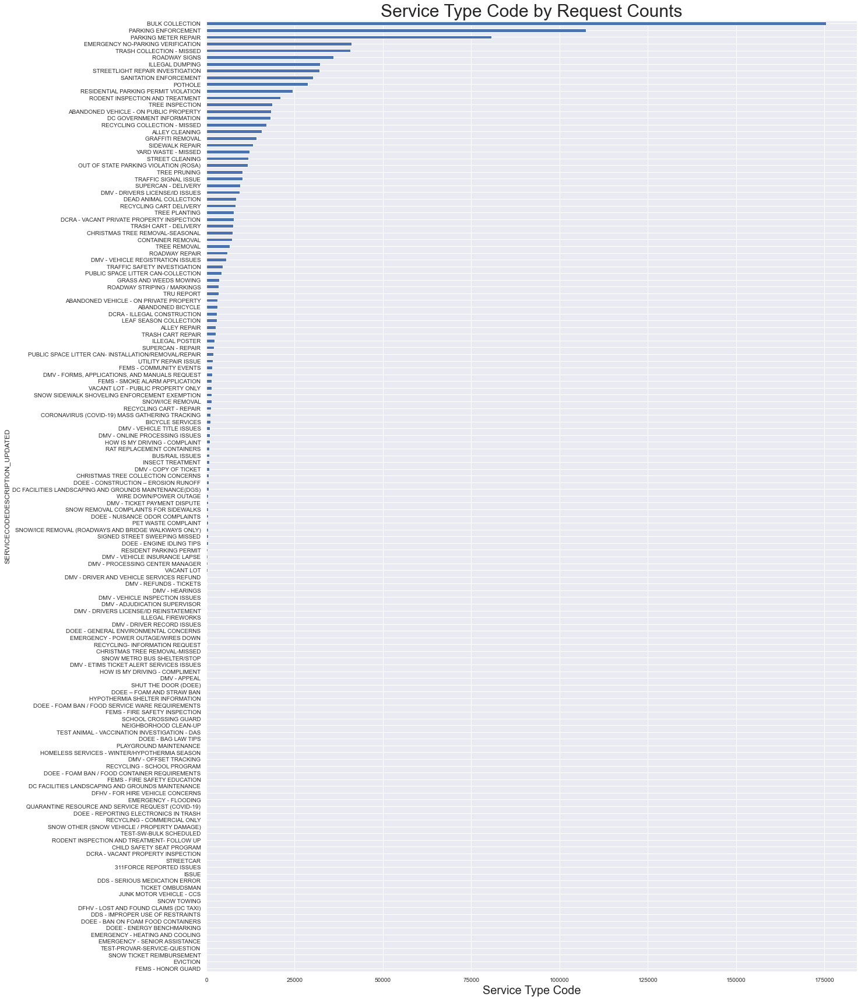

In [496]:
service_type=pd.DataFrame(data_311.groupby('SERVICECODEDESCRIPTION_UPDATED')['SERVICECALLCOUNT'].describe(percentiles=[0.05,.25,.50,.75,.85,.90, .95,.99])).sort_values(by=['count'], ascending=True)
# SERVICECODEDESCRIPTION_UPDATED
plt.figure(figsize=(20,30))
service_type['count'].plot.barh()
plt.title('Service Type Code by Request Counts', fontsize=30)


plt.yticks(fontsize=10)
plt.xticks(fontsize=10)
plt.xlabel('Service Type Code', fontsize=20)
plt.show()

In [497]:
#Service Code  by Ward 

mask=data_311[(data_311['WARD_UPDATED']!='<NA>')& (~data_311['SERVICECODEDESCRIPTION_UPDATED'].isna())]
service_code = pd.DataFrame(mask.groupby(['WARD_UPDATED','SERVICECODEDESCRIPTION_UPDATED'])['SERVICECODEDESCRIPTION_UPDATED'].count())#.reset_index()
service_code.columns=['count']
service_code =service_code.reset_index()

service_code=service_code.pivot(index='WARD_UPDATED', columns='SERVICECODEDESCRIPTION_UPDATED', values='count')#.plot.bar()
service_code


SERVICECODEDESCRIPTION_UPDATED,311FORCE REPORTED ISSUES,ABANDONED BICYCLE,ABANDONED VEHICLE - ON PRIVATE PROPERTY,ABANDONED VEHICLE - ON PUBLIC PROPERTY,ALLEY CLEANING,ALLEY REPAIR,BICYCLE SERVICES,BULK COLLECTION,BUS/RAIL ISSUES,CHILD SAFETY SEAT PROGRAM,CHRISTMAS TREE COLLECTION CONCERNS,CHRISTMAS TREE REMOVAL-MISSED,CHRISTMAS TREE REMOVAL-SEASONAL,CONTAINER REMOVAL,CORONAVIRUS (COVID-19) MASS GATHERING TRACKING,DC FACILITIES LANDSCAPING AND GROUNDS MAINTENANCE,DC FACILITIES LANDSCAPING AND GROUNDS MAINTENANCE(DGS),DC GOVERNMENT INFORMATION,DCRA - ILLEGAL CONSTRUCTION,DCRA - VACANT PRIVATE PROPERTY INSPECTION,DCRA - VACANT PROPERTY INSPECTION,DDS - IMPROPER USE OF RESTRAINTS,DDS - SERIOUS MEDICATION ERROR,DEAD ANIMAL COLLECTION,DFHV - FOR HIRE VEHICLE CONCERNS,DFHV - LOST AND FOUND CLAIMS (DC TAXI),DMV - ADJUDICATION SUPERVISOR,DMV - APPEAL,DMV - COPY OF TICKET,DMV - DRIVER AND VEHICLE SERVICES REFUND,DMV - DRIVER RECORD ISSUES,DMV - DRIVERS LICENSE/ID ISSUES,DMV - DRIVERS LICENSE/ID REINSTATEMENT,DMV - ETIMS TICKET ALERT SERVICES ISSUES,"DMV - FORMS, APPLICATIONS, AND MANUALS REQUEST",DMV - HEARINGS,DMV - OFFSET TRACKING,DMV - ONLINE PROCESSING ISSUES,DMV - PROCESSING CENTER MANAGER,DMV - REFUNDS - TICKETS,DMV - TICKET PAYMENT DISPUTE,DMV - VEHICLE INSPECTION ISSUES,DMV - VEHICLE INSURANCE LAPSE,DMV - VEHICLE REGISTRATION ISSUES,DMV - VEHICLE TITLE ISSUES,DOEE - BAG LAW TIPS,DOEE - BAN ON FOAM FOOD CONTAINERS,DOEE - CONSTRUCTION – EROSION RUNOFF,DOEE - ENERGY BENCHMARKING,DOEE - ENGINE IDLING TIPS,DOEE - FOAM BAN / FOOD CONTAINER REQUIREMENTS,DOEE - FOAM BAN / FOOD SERVICE WARE REQUIREMENTS,DOEE - GENERAL ENVIRONMENTAL CONCERNS,DOEE - NUISANCE ODOR COMPLAINTS,DOEE - REPORTING ELECTRONICS IN TRASH,DOEE – FOAM AND STRAW BAN,EMERGENCY - FLOODING,EMERGENCY - HEATING AND COOLING,EMERGENCY - POWER OUTAGE/WIRES DOWN,EMERGENCY - SENIOR ASSISTANCE,EMERGENCY NO-PARKING VERIFICATION,EVICTION,FEMS - COMMUNITY EVENTS,FEMS - FIRE SAFETY EDUCATION,FEMS - FIRE SAFETY INSPECTION,FEMS - HONOR GUARD,FEMS - SMOKE ALARM APPLICATION,GRAFFITI REMOVAL,GRASS AND WEEDS MOWING,HOMELESS SERVICES - WINTER/HYPOTHERMIA SEASON,HOW IS MY DRIVING - COMPLAINT,HOW IS MY DRIVING - COMPLIMENT,HYPOTHERMIA SHELTER INFORMATION,ILLEGAL DUMPING,ILLEGAL FIREWORKS,ILLEGAL POSTER,INSECT TREATMENT,ISSUE,JUNK MOTOR VEHICLE - CCS,LEAF SEASON COLLECTION,NEIGHBORHOOD CLEAN-UP,OUT OF STATE PARKING VIOLATION (ROSA),PARKING ENFORCEMENT,PARKING METER REPAIR,PET WASTE COMPLAINT,PLAYGROUND MAINTENANCE,POTHOLE,PUBLIC SPACE LITTER CAN- INSTALLATION/REMOVAL/REPAIR,PUBLIC SPACE LITTER CAN-COLLECTION,QUARANTINE RESOURCE AND SERVICE REQUEST (COVID-19),RAT REPLACEMENT CONTAINERS,RECYCLING - COMMERCIAL ONLY,RECYCLING - SCHOOL PROGRAM,RECYCLING CART - REPAIR,RECYCLING CART DELIVERY,RECYCLING COLLECTION - MISSED,RECYCLING- INFORMATION REQUEST,RESIDENT PARKING PERMIT,RESIDENTIAL PARKING PERMIT VIOLATION,ROADWAY REPAIR,ROADWAY SIGNS,ROADWAY STRIPING / MARKINGS,RODENT INSPECTION AND TREATMENT,RODENT INSPECTION AND TREATMENT- FOLLOW UP,SANITATION ENFORCEMENT,SCHOOL CROSSING GUARD,SHUT THE DOOR (DOEE),SIDEWALK REPAIR,SIGNED STREET SWEEPING MISSED,SNOW METRO BUS SHELTER/STOP,SNOW OTHER (SNOW VEHICLE / PROPERTY DAMAGE),SNOW REMOVAL COMPLAINTS FOR SIDEWALKS,SNOW SIDEWALK SHOVELING ENFORCEMENT EXEMPTION,SNOW TICKET REIMBURSEMENT,SNOW TOWING,SNOW/ICE REMOVAL,SNOW/ICE REMOVAL (ROADWAYS AND BRIDGE WALKWAYS ONLY),STREET CLEANING,STREETCAR,STREETLIGHT REPAIR INVESTIGATION,SUPERCAN - DELIVERY,SUPERCAN - REPAIR,TEST ANIMAL - VACCINATION INVESTIGATION - DAS,TEST-PROVAR-SERVICE-QUESTION,TEST-SW-BULK SCHEDULED,TICKET OMBUDSMAN,TRAFFIC SAFETY INVESTIGATION,TRAFFIC SIGNAL ISSUE,TRASH CART - DELIVERY,TRASH CART REPAIR,TRASH COLLECTION - MISSED,TREE INSPECTION,TREE PLANTING,TREE PRUNING,TREE REMOVAL,TRU REPORT,UTILITY REPAIR ISSUE,VACANT LOT,VACANT LOT - PUBLIC PROPERTY ONLY,WIRE DOWN/POWER OUTAGE,YARD WASTE - MISSED
WARD_UPDATED,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,

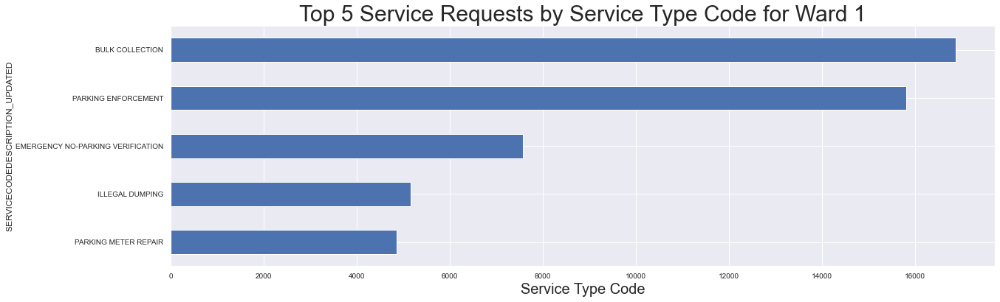

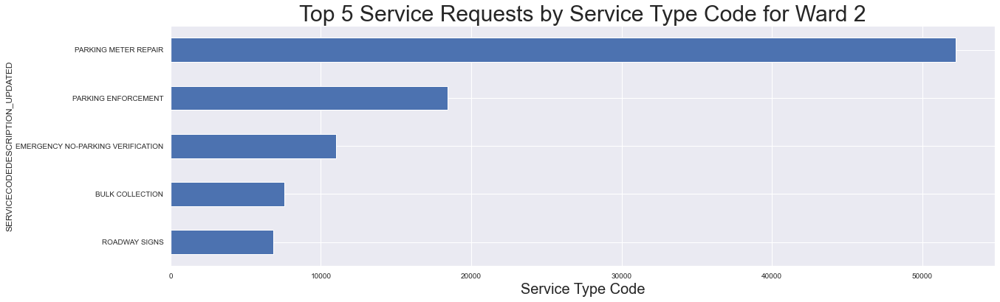

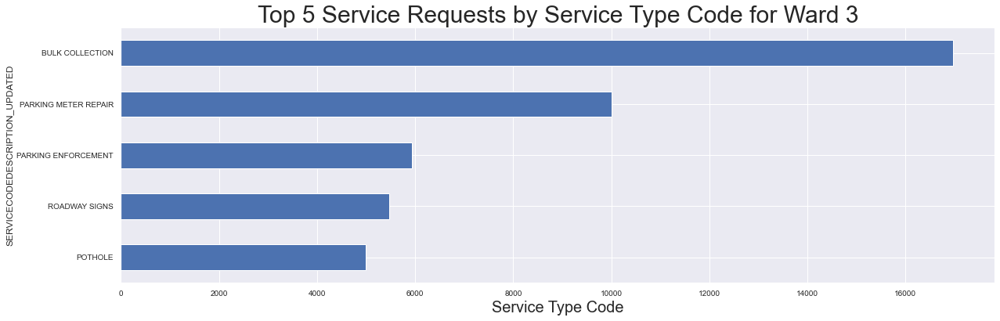

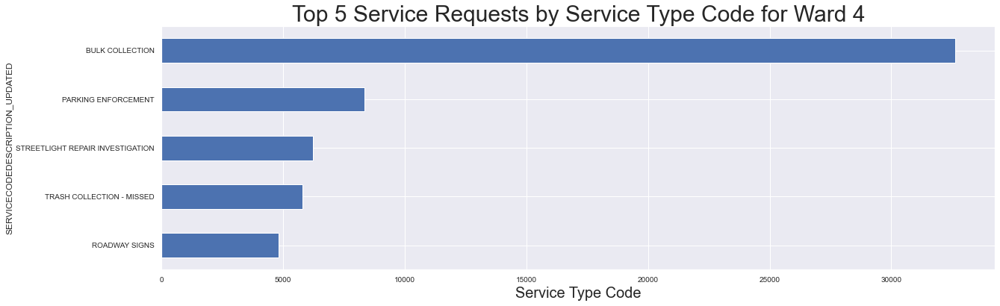

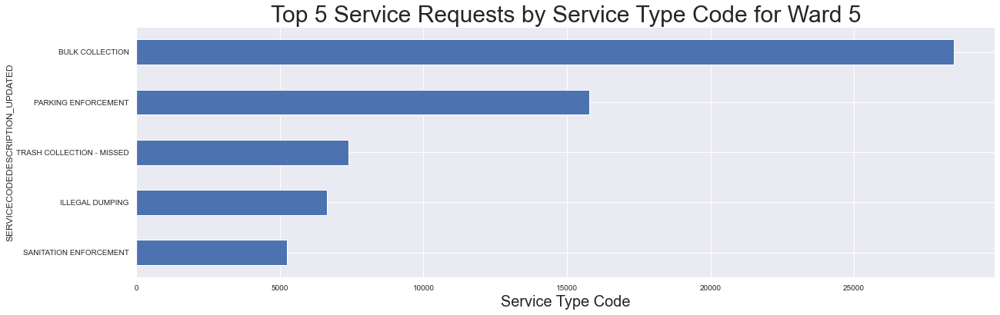

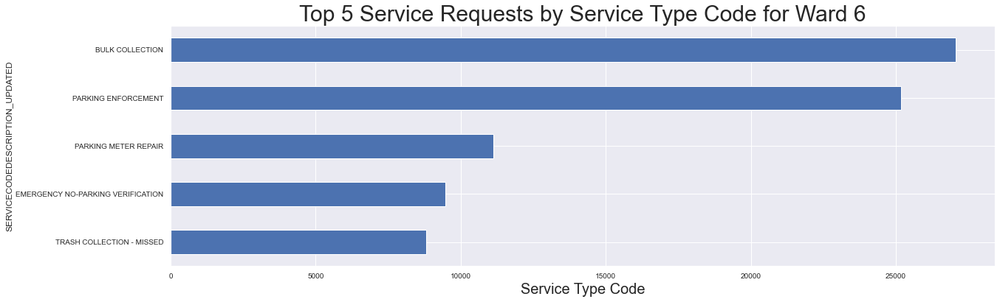

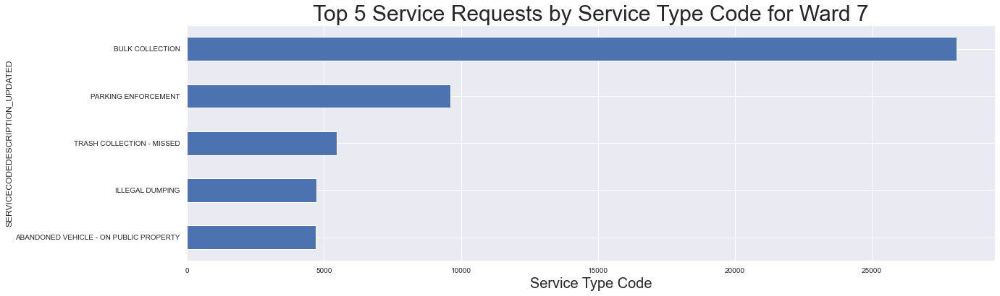

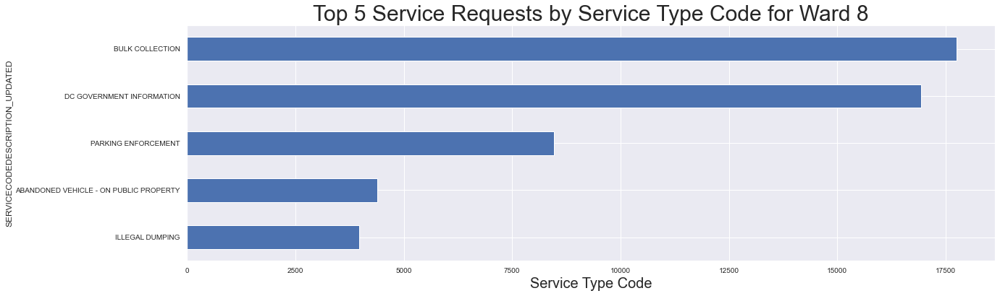

In [498]:
#Top 3 Service Code by Ward

for i in service_code.index:
    service_code.loc[str(i)].sort_values(ascending=False).head(5).sort_values(ascending=True).plot.barh()

    plt.title('Top 5 Service Requests by Service Type Code for Ward ' + str(i), fontsize=30)


    plt.yticks(fontsize=10)
    plt.xticks(fontsize=10)
    plt.xlabel('Service Type Code', fontsize=20)
    plt.show()



## Service Code by Ward


---------------------------------------------------------------------------------------------------- 

SERVICE REQUESTS Counts by SERVICE CODE DESCRIPTION by Ward
---------------------------------------------------------------------------------------------------- 

---------------------------------------------------------------------------------------------------- 



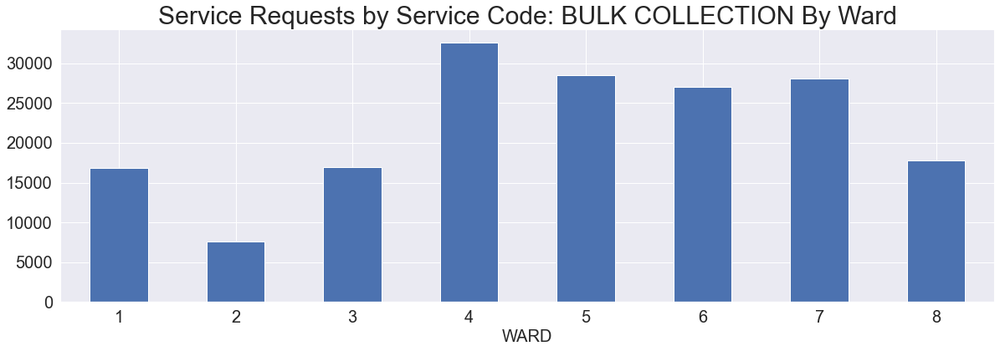

---------------------------------------------------------------------------------------------------- 



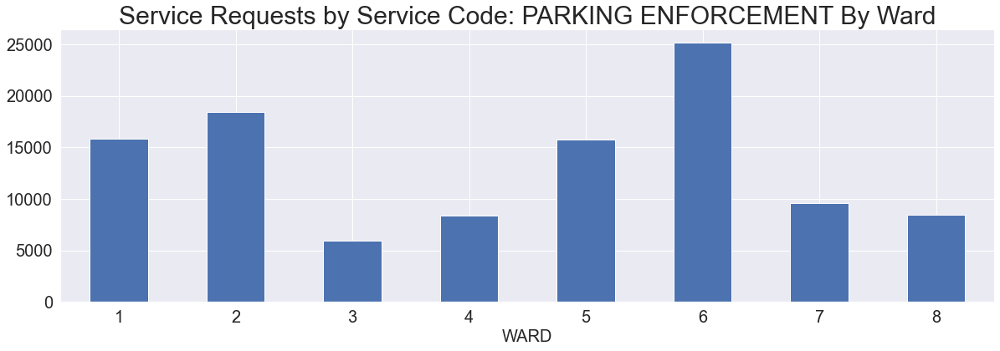

---------------------------------------------------------------------------------------------------- 



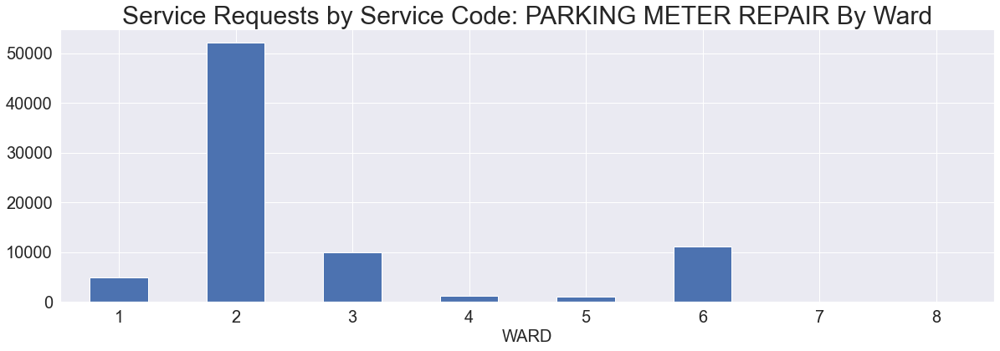

---------------------------------------------------------------------------------------------------- 



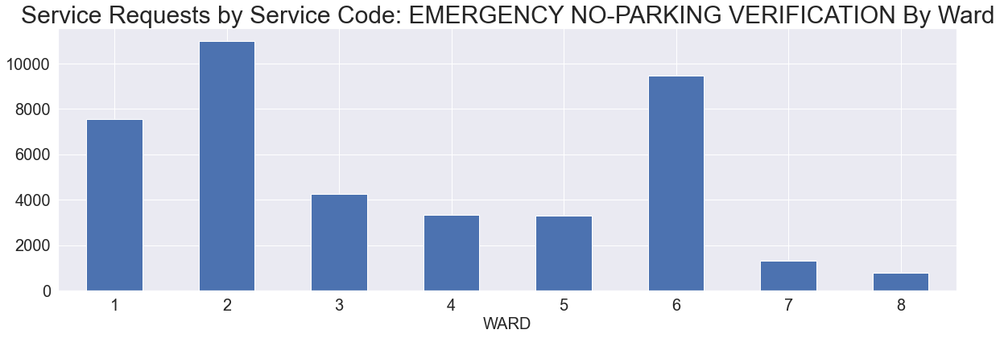

---------------------------------------------------------------------------------------------------- 



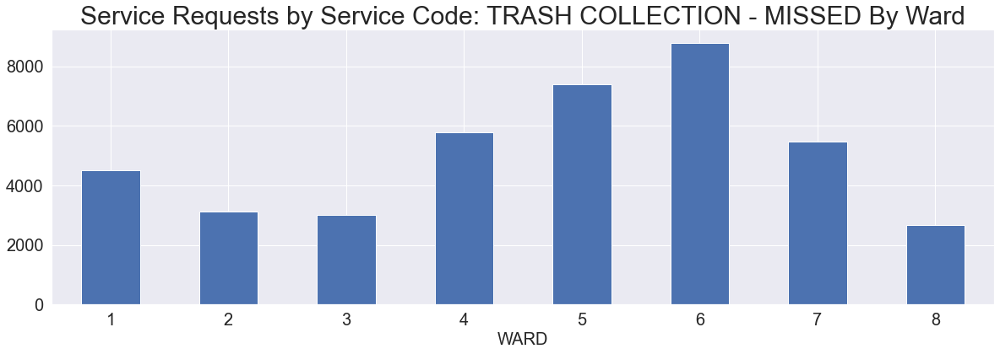

---------------------------------------------------------------------------------------------------- 



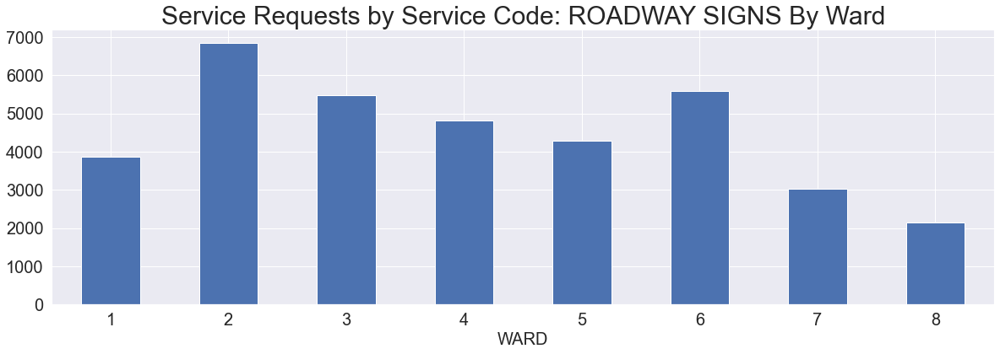

---------------------------------------------------------------------------------------------------- 



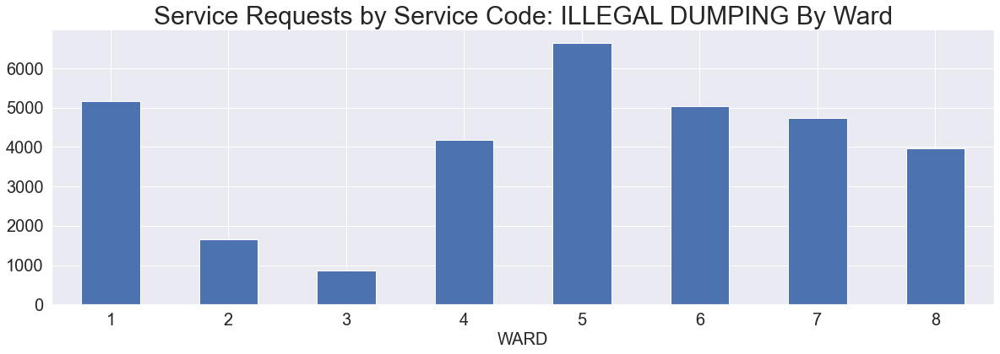

---------------------------------------------------------------------------------------------------- 



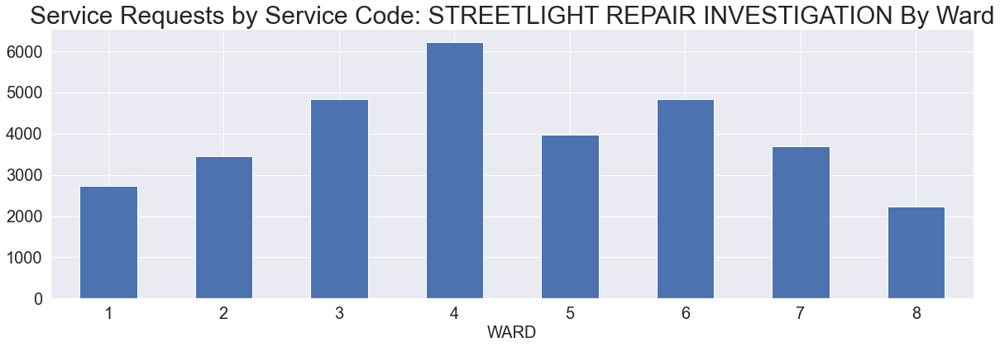

---------------------------------------------------------------------------------------------------- 



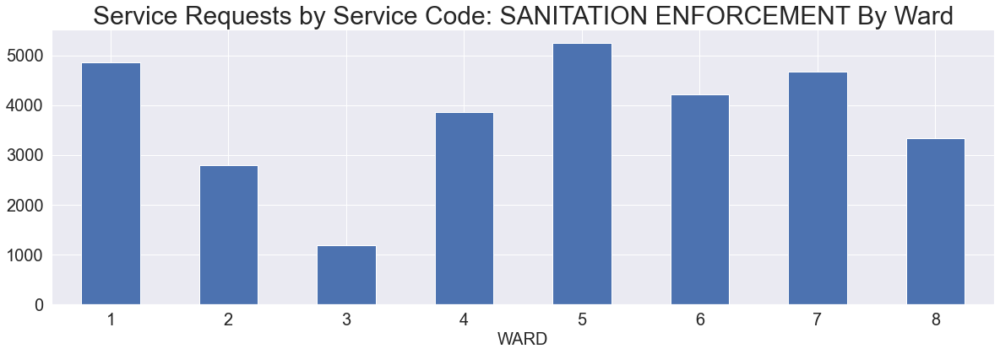

---------------------------------------------------------------------------------------------------- 



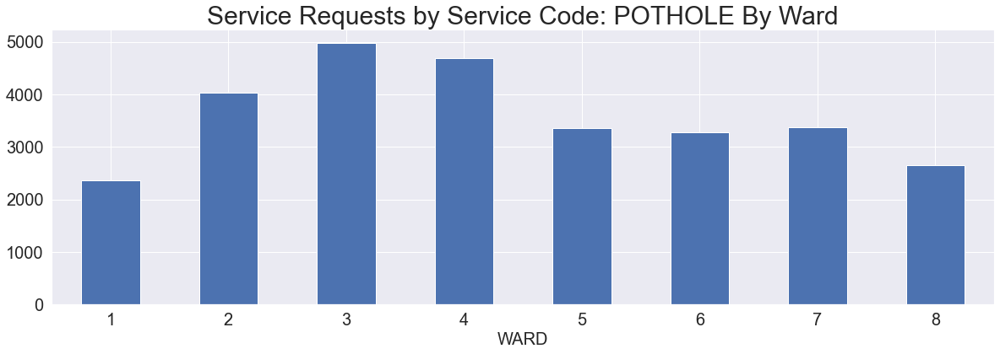

---------------------------------------------------------------------------------------------------- 



In [499]:
print('-----'*20,'\n')
print('SERVICE REQUESTS Counts by SERVICE CODE DESCRIPTION by Ward')
print('-----'*20,'\n')

pd.DataFrame(service_type.sort_values(by=['count'], ascending=False)['count'].head(10)).reset_index()
print('-----'*20,'\n')
mask= pd.DataFrame(service_type.sort_values(by=['count'], ascending=False)['count'].head(10)).reset_index()
for i in mask['SERVICECODEDESCRIPTION_UPDATED'].unique():
#     print(i)
    service_code[i].plot.bar()
    plt.title('Service Requests by Service Code: '+ i + ' By Ward', fontsize=30)


    plt.yticks(fontsize=20)
    plt.xticks(fontsize=20,rotation=0)
    plt.xlabel('WARD', fontsize=20)
    plt.show()
    print('-----'*20,'\n')


---------------------------------------------------------------------------------------------------- 



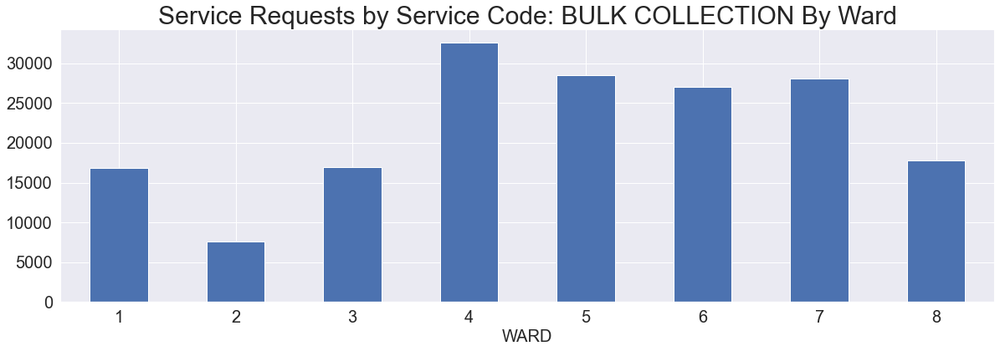

---------------------------------------------------------------------------------------------------- 



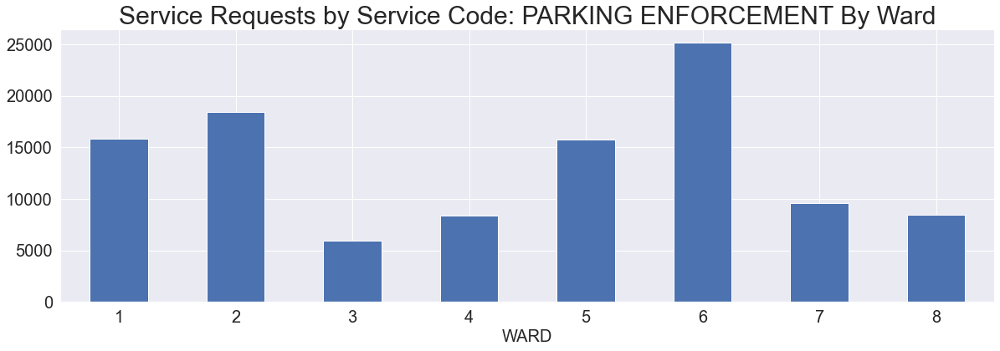

---------------------------------------------------------------------------------------------------- 



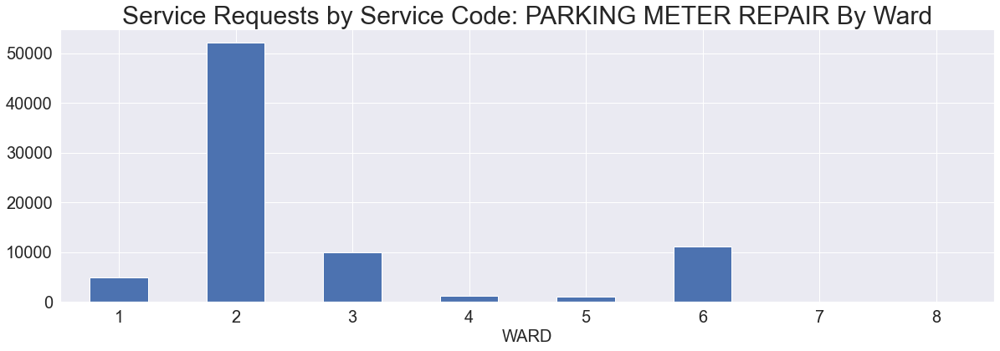

---------------------------------------------------------------------------------------------------- 



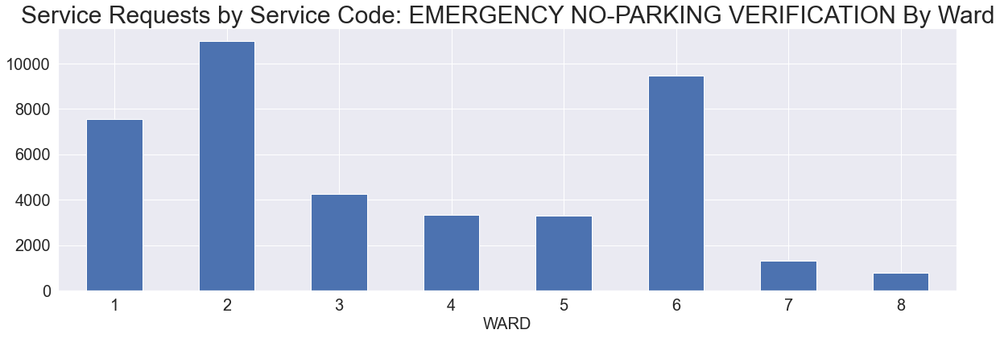

---------------------------------------------------------------------------------------------------- 



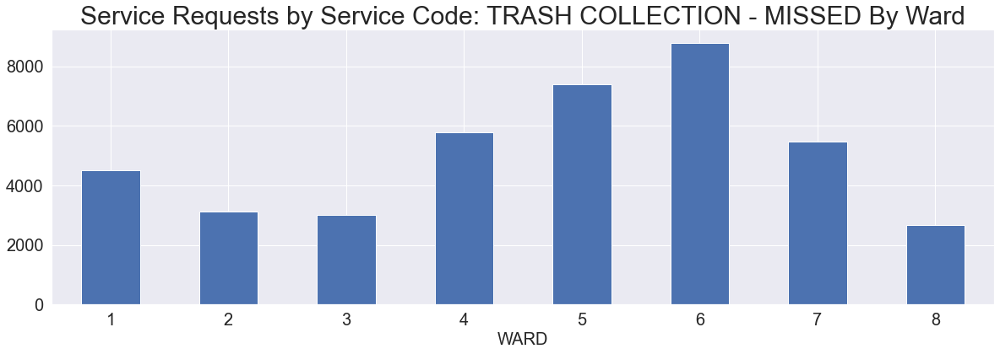

---------------------------------------------------------------------------------------------------- 



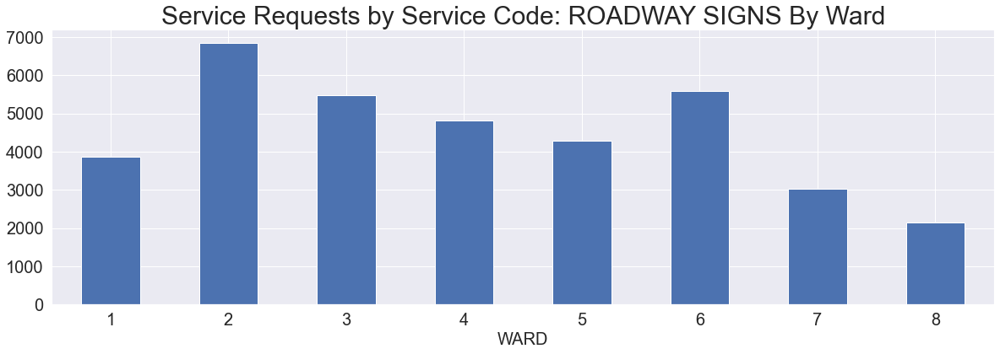

---------------------------------------------------------------------------------------------------- 



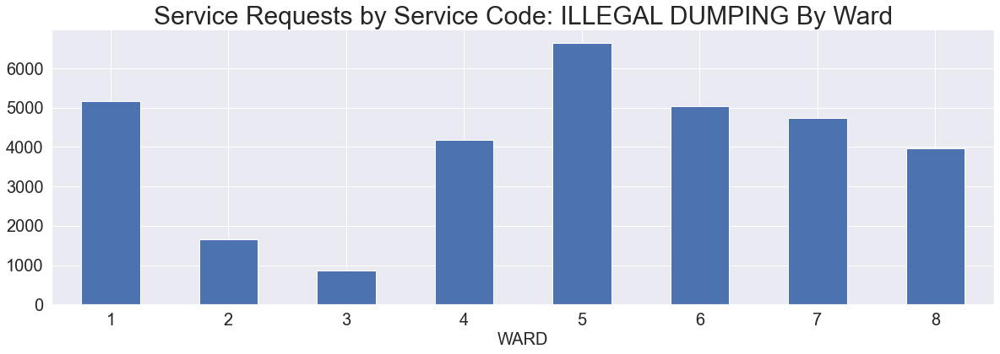

---------------------------------------------------------------------------------------------------- 



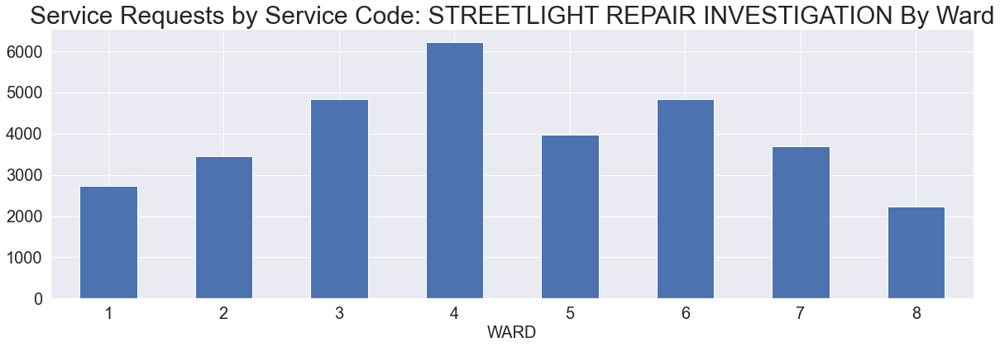

---------------------------------------------------------------------------------------------------- 



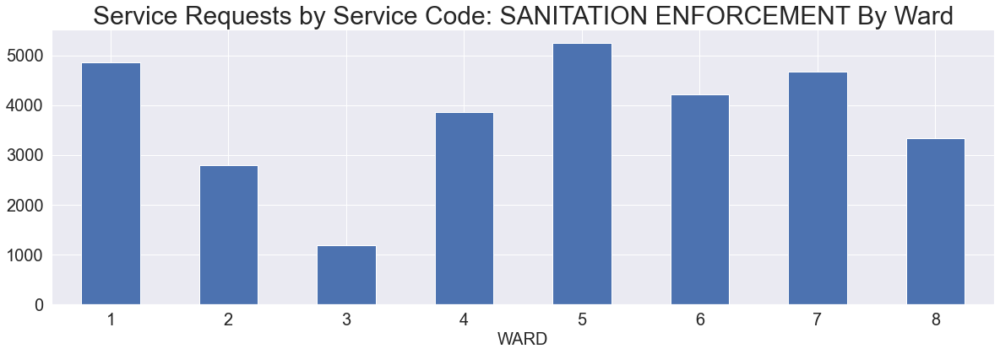

---------------------------------------------------------------------------------------------------- 



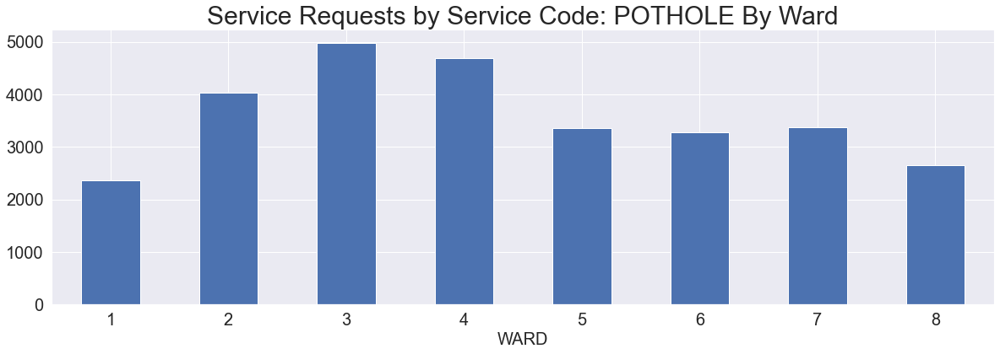

---------------------------------------------------------------------------------------------------- 



In [500]:
# service_code.pivot(index='WARD_UPDATED', columns='SERVICECODEDESCRIPTION_UPDATED', values='count').plot.bar()
print('-----'*20,'\n')
for i in mask['SERVICECODEDESCRIPTION_UPDATED'].unique():
    service_code[i].plot.bar()
    plt.title('Service Requests by Service Code: '+ i + ' By Ward', fontsize=30)


    plt.yticks(fontsize=20)
    plt.xticks(fontsize=20,rotation=0)
    plt.xlabel('WARD', fontsize=20)
    plt.show()
    print('-----'*20,'\n')

In [501]:
print('start: ', pd.Timestamp.now())

start:  2021-04-04 22:54:40.163854


In [502]:
print('start: ', pd.Timestamp.now())

start:  2021-04-04 22:54:40.244388
